# Telecom Churn Case Study
## <u>Problem Statement</u>
 

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.



*Let's start by importing some basic libraries.*

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings('ignore')

*Importing the data as follows.*

In [2]:
data = pd.read_csv('telecom_churn_data.csv')

*Let's carry out some basic inspection of data*

In [3]:
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

- Data contains all the columns in numeric forms.
- Data also contains dates.

In [4]:
data.shape

(99999, 226)

In [5]:
dtypes = pd.DataFrame(data.dtypes, columns = ['dtypes'])
dtypes

,dtypes
mobile_number,int64
circle_id,int64
loc_og_t2o_mou,float64
std_og_t2o_mou,float64
loc_ic_t2o_mou,float64
last_date_of_month_6,object
last_date_of_month_7,object
last_date_of_month_8,object
last_date_of_month_9,object
arpu_6,float64


- Columns containing dates are present as 'object' in the data.

*Let's drop these columns containing dates as they are not useful in the context of the problem.*

In [6]:
dates = list(dtypes[dtypes['dtypes'] == 'object'].index)
dates

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_9',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8',
 'date_of_last_rech_data_9']

In [7]:
data.drop(dates, axis = 1, inplace = True)

*Let's now determine the percentages of missing values in the columns.*

In [8]:
missing_percentages = pd.DataFrame(100*data.isnull().sum()/data.shape[0], columns = ['Missing Percentages'])
missing_percentages = missing_percentages.sort_values(ascending = False, by = 'Missing Percentages')
missing_percentages

,Missing Percentages
arpu_3g_6,74.846748
fb_user_6,74.846748
arpu_2g_6,74.846748
night_pck_user_6,74.846748
total_rech_data_6,74.846748
max_rech_data_6,74.846748
count_rech_2g_6,74.846748
av_rech_amt_data_6,74.846748
count_rech_3g_6,74.846748
count_rech_3g_7,74.428744


- Some columns have more than 70% of missing values.
- Some columns have less than 10% of missing values.
- Both these types of columns needs to be treated separately.

*Let's first address the columns with lower percentages of missing values.*

In [9]:
lower_missing = list(missing_percentages[(missing_percentages['Missing Percentages']>=0) & (missing_percentages['Missing Percentages']<50)].index)
lower_missing

['loc_ic_t2f_mou_9',
 'isd_og_mou_9',
 'std_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'loc_ic_t2t_mou_9',
 'isd_ic_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'spl_ic_mou_9',
 'ic_others_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_og_t2c_mou_9',
 'onnet_mou_9',
 'std_og_t2t_mou_9',
 'offnet_mou_9',
 'std_og_t2m_mou_9',
 'loc_og_mou_9',
 'roam_ic_mou_9',
 'loc_og_t2f_mou_9',
 'roam_og_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2c_mou_8',
 'std_ic_t2o_mou_8',
 'std_ic_mou_8',
 'std_ic_t2m_mou_8',
 'std_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_og_t2f_mou_8',
 'ic_others_8',
 'spl_ic_mou_8',
 'loc_og_t2f_mou_8',
 'isd_ic_mou_8',
 'loc_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_t2t_mou_8',
 'roam_og_mou_8',
 'roam_ic_mou_8',
 'offnet_mou_8',
 'onnet_mou_8',
 'loc_ic_t2f_mou_8',
 'std_ic_t2f_mou_8',
 'og_others_8',
 'std_og_t2m_mou_8',
 'loc_og_mou_8',
 'isd_og_m

- `lower_missing` also contains the column `mobile_number` which is an identifier. Let's remove it.

In [10]:
lower_missing.remove('mobile_number')
lower_missing

['loc_ic_t2f_mou_9',
 'isd_og_mou_9',
 'std_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'loc_ic_t2t_mou_9',
 'isd_ic_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'spl_ic_mou_9',
 'ic_others_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_og_t2c_mou_9',
 'onnet_mou_9',
 'std_og_t2t_mou_9',
 'offnet_mou_9',
 'std_og_t2m_mou_9',
 'loc_og_mou_9',
 'roam_ic_mou_9',
 'loc_og_t2f_mou_9',
 'roam_og_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2c_mou_8',
 'std_ic_t2o_mou_8',
 'std_ic_mou_8',
 'std_ic_t2m_mou_8',
 'std_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_og_t2f_mou_8',
 'ic_others_8',
 'spl_ic_mou_8',
 'loc_og_t2f_mou_8',
 'isd_ic_mou_8',
 'loc_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_t2t_mou_8',
 'roam_og_mou_8',
 'roam_ic_mou_8',
 'offnet_mou_8',
 'onnet_mou_8',
 'loc_ic_t2f_mou_8',
 'std_ic_t2f_mou_8',
 'og_others_8',
 'std_og_t2m_mou_8',
 'loc_og_mou_8',
 'isd_og_m

*Let's address these columns by means of* **IterativeImputer.**

In [11]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer = IterativeImputer(random_state = 0)

data[lower_missing] = imputer.fit_transform(data[lower_missing])

In [12]:
data[lower_missing].isnull().sum()

loc_ic_t2f_mou_9      0
isd_og_mou_9          0
std_og_mou_9          0
spl_og_mou_9          0
og_others_9           0
loc_ic_t2t_mou_9      0
isd_ic_mou_9          0
loc_ic_mou_9          0
std_ic_t2t_mou_9      0
std_ic_t2m_mou_9      0
std_ic_t2f_mou_9      0
std_ic_t2o_mou_9      0
std_ic_mou_9          0
spl_ic_mou_9          0
ic_others_9           0
std_og_t2f_mou_9      0
std_og_t2c_mou_9      0
loc_ic_t2m_mou_9      0
loc_og_t2c_mou_9      0
onnet_mou_9           0
std_og_t2t_mou_9      0
offnet_mou_9          0
std_og_t2m_mou_9      0
loc_og_mou_9          0
roam_ic_mou_9         0
loc_og_t2f_mou_9      0
roam_og_mou_9         0
loc_og_t2m_mou_9      0
loc_og_t2t_mou_9      0
loc_og_t2c_mou_8      0
std_ic_t2o_mou_8      0
std_ic_mou_8          0
std_ic_t2m_mou_8      0
std_ic_t2t_mou_8      0
loc_ic_mou_8          0
std_og_t2f_mou_8      0
ic_others_8           0
spl_ic_mou_8          0
loc_og_t2f_mou_8      0
isd_ic_mou_8          0
loc_ic_t2m_mou_8      0
loc_og_t2m_mou_8

- It can observed that the missing values of these columns has been addressed.

*Let's now address the columns with higher percentage of missing values.*

In [13]:
higher_missing = list(missing_percentages[missing_percentages['Missing Percentages'] >= 50].index)
higher_missing

['arpu_3g_6',
 'fb_user_6',
 'arpu_2g_6',
 'night_pck_user_6',
 'total_rech_data_6',
 'max_rech_data_6',
 'count_rech_2g_6',
 'av_rech_amt_data_6',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'fb_user_7',
 'night_pck_user_7',
 'max_rech_data_7',
 'count_rech_2g_7',
 'total_rech_data_7',
 'av_rech_amt_data_7',
 'arpu_3g_7',
 'arpu_2g_7',
 'arpu_2g_9',
 'arpu_3g_9',
 'count_rech_3g_9',
 'max_rech_data_9',
 'av_rech_amt_data_9',
 'total_rech_data_9',
 'fb_user_9',
 'count_rech_2g_9',
 'night_pck_user_9',
 'arpu_3g_8',
 'fb_user_8',
 'night_pck_user_8',
 'count_rech_3g_8',
 'arpu_2g_8',
 'total_rech_data_8',
 'av_rech_amt_data_8',
 'max_rech_data_8',
 'count_rech_2g_8']

In [14]:
data[higher_missing].head()

,arpu_3g_6,fb_user_6,arpu_2g_6,night_pck_user_6,total_rech_data_6,max_rech_data_6,count_rech_2g_6,av_rech_amt_data_6,count_rech_3g_6,count_rech_3g_7,fb_user_7,night_pck_user_7,max_rech_data_7,count_rech_2g_7,total_rech_data_7,av_rech_amt_data_7,arpu_3g_7,arpu_2g_7,arpu_2g_9,arpu_3g_9,count_rech_3g_9,max_rech_data_9,av_rech_amt_data_9,total_rech_data_9,fb_user_9,count_rech_2g_9,night_pck_user_9,arpu_3g_8,fb_user_8,night_pck_user_8,count_rech_3g_8,arpu_2g_8,total_rech_data_8,av_rech_amt_data_8,max_rech_data_8,count_rech_2g_8
0,212.17,1.0,212.17,0.0,1.0,252.0,0.0,252.0,1.0,1.0,1.0,0.0,252.0,0.0,1.0,252.0,212.17,212.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,212.17,1.0,0.0,1.0,212.17,1.0,252.0,252.0,0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0.0,154.0,1.0,1.0,154.0,0.00,28.61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,1.0,0.0,0.0,7.60,2.0,50.0,25.0,2.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2.84,0.0,46.0,46.0,1.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.00,0.0,0.00,0.0,1.0,56.0,1.0,56.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
data[higher_missing].nunique().sort_values(ascending = False)

arpu_3g_9             8063
arpu_3g_8             7787
arpu_3g_6             7418
arpu_3g_7             7246
arpu_2g_6             6990
arpu_2g_9             6795
arpu_2g_8             6652
arpu_2g_7             6586
av_rech_amt_data_8     973
av_rech_amt_data_7     961
av_rech_amt_data_9     945
av_rech_amt_data_6     887
max_rech_data_9         50
max_rech_data_8         50
max_rech_data_6         48
max_rech_data_7         48
total_rech_data_8       46
total_rech_data_7       42
total_rech_data_6       37
total_rech_data_9       37
count_rech_2g_7         36
count_rech_2g_8         34
count_rech_2g_9         32
count_rech_2g_6         31
count_rech_3g_8         29
count_rech_3g_7         28
count_rech_3g_9         27
count_rech_3g_6         25
night_pck_user_9         2
night_pck_user_7         2
fb_user_7                2
night_pck_user_8         2
fb_user_9                2
night_pck_user_6         2
fb_user_6                2
fb_user_8                2
dtype: int64

- Some columns have only two unique values i.e. they act as binary categorical columns.

*Let's first inpect these binary categorical columns.*

In [16]:
data[['night_pck_user_9','night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_9', 'night_pck_user_6',         
'fb_user_6','fb_user_8']].head()

,night_pck_user_9,night_pck_user_7,fb_user_7,night_pck_user_8,fb_user_9,night_pck_user_6,fb_user_6,fb_user_8
0,NaN,0.0,1.0,0.0,NaN,0.0,1.0,1.0
1,NaN,0.0,1.0,0.0,NaN,NaN,NaN,1.0
2,0.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN


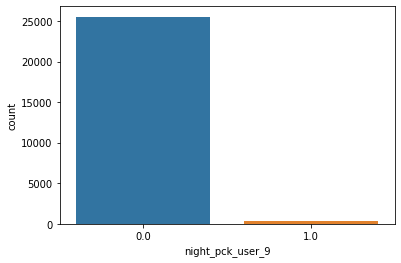

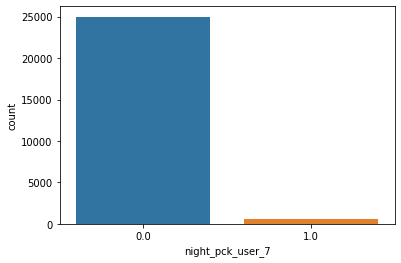

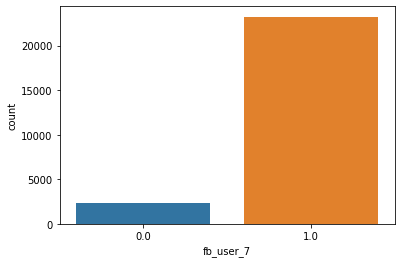

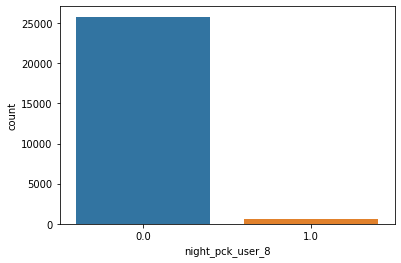

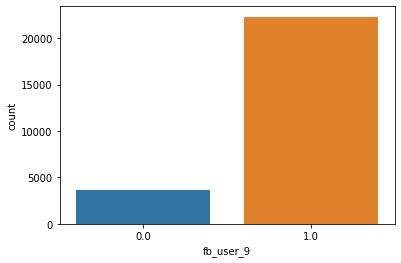

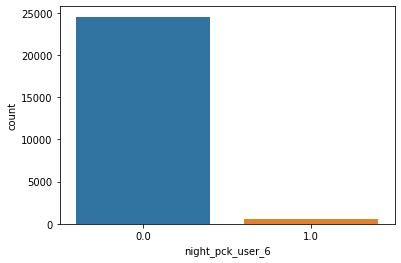

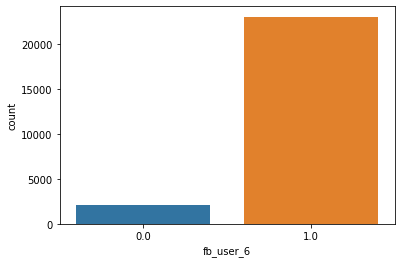

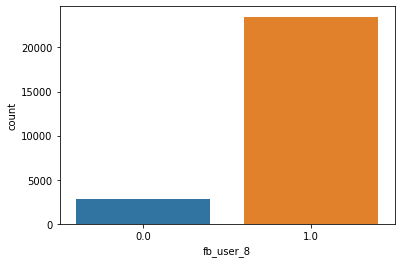

In [17]:
for i in ['night_pck_user_9','night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_9', 'night_pck_user_6',         
'fb_user_6','fb_user_8']:
    sns.countplot(data[i])
    plt.show()

- All the columns are highly skewed.
- The columns captures the information about whether the customers are Facebook and Night-pack users or not.
- People mostly use Facebook but not Night-pack.

*Let's fill the missing values with the category* **-1**. 

In [18]:
for i in ['night_pck_user_9','night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_9', 'night_pck_user_6',         
'fb_user_6','fb_user_8']:
    data[i].fillna(value = -1, inplace = True)

*Let's now again check the count of these categories as follows and remove the columns with a single category having count of at least 90%.* 

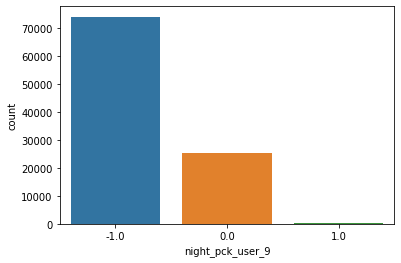

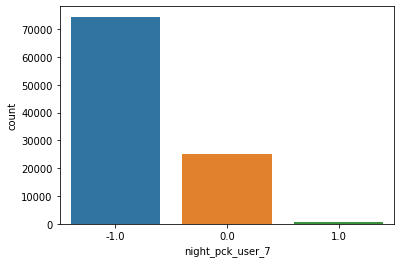

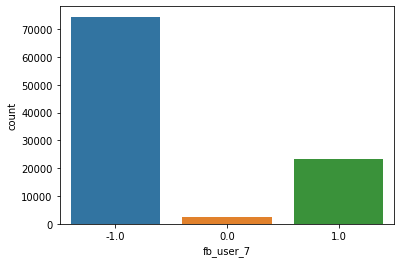

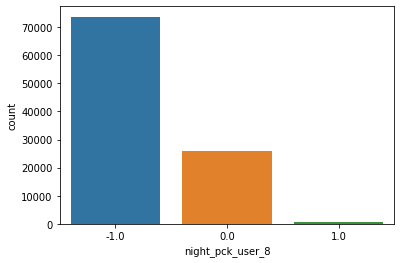

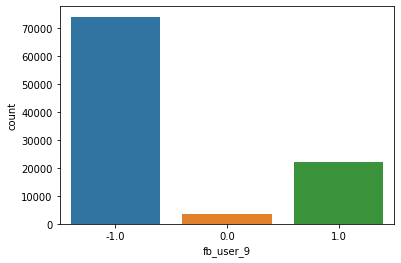

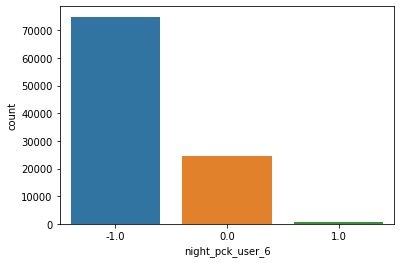

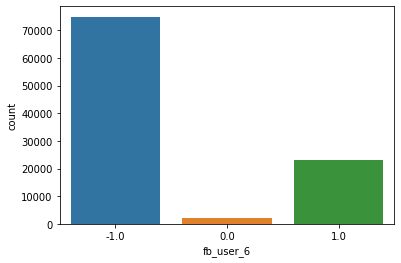

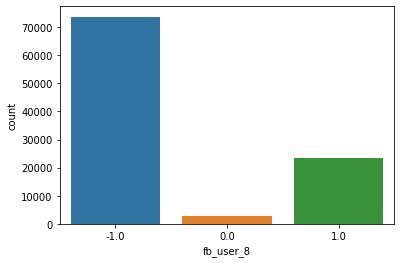

In [19]:
for i in ['night_pck_user_9','night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_9', 'night_pck_user_6',         
'fb_user_6','fb_user_8']:
    sns.countplot(data[i])
    plt.show()

*Let's now inpect the other columns with high percentage of missing values.*

In [20]:
cols_to_address = ['arpu_3g_9','arpu_3g_8','arpu_3g_6','arpu_3g_7','arpu_2g_6','arpu_2g_9','arpu_2g_8','arpu_2g_7','av_rech_amt_data_8',    
'av_rech_amt_data_7','av_rech_amt_data_9','av_rech_amt_data_6','max_rech_data_9','max_rech_data_8','max_rech_data_6',       
'max_rech_data_7','total_rech_data_8','total_rech_data_7','total_rech_data_6','total_rech_data_9','count_rech_2g_7',       
'count_rech_2g_8','count_rech_2g_9','count_rech_2g_6','count_rech_3g_8','count_rech_3g_7','count_rech_3g_9',         
'count_rech_3g_6']

cols_to_address

['arpu_3g_9',
 'arpu_3g_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_2g_6',
 'arpu_2g_9',
 'arpu_2g_8',
 'arpu_2g_7',
 'av_rech_amt_data_8',
 'av_rech_amt_data_7',
 'av_rech_amt_data_9',
 'av_rech_amt_data_6',
 'max_rech_data_9',
 'max_rech_data_8',
 'max_rech_data_6',
 'max_rech_data_7',
 'total_rech_data_8',
 'total_rech_data_7',
 'total_rech_data_6',
 'total_rech_data_9',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_2g_9',
 'count_rech_2g_6',
 'count_rech_3g_8',
 'count_rech_3g_7',
 'count_rech_3g_9',
 'count_rech_3g_6']

In [21]:
data[cols_to_address].head()

,arpu_3g_9,arpu_3g_8,arpu_3g_6,arpu_3g_7,arpu_2g_6,arpu_2g_9,arpu_2g_8,arpu_2g_7,av_rech_amt_data_8,av_rech_amt_data_7,av_rech_amt_data_9,av_rech_amt_data_6,max_rech_data_9,max_rech_data_8,max_rech_data_6,max_rech_data_7,total_rech_data_8,total_rech_data_7,total_rech_data_6,total_rech_data_9,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_2g_6,count_rech_3g_8,count_rech_3g_7,count_rech_3g_9,count_rech_3g_6
0,NaN,212.17,212.17,212.17,212.17,NaN,212.17,212.17,252.0,252.0,NaN,252.0,NaN,252.0,252.0,252.0,1.0,1.0,1.0,NaN,0.0,0.0,NaN,0.0,1.0,1.0,NaN,1.0
1,NaN,0.00,NaN,0.00,NaN,NaN,7.60,28.61,50.0,154.0,NaN,NaN,NaN,25.0,NaN,154.0,2.0,1.0,NaN,NaN,1.0,2.0,NaN,NaN,0.0,0.0,NaN,NaN
2,2.84,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,46.0,NaN,46.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,56.0,NaN,NaN,56.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,0.0


In [22]:
for i in cols_to_address:
    print(data[i].quantile(0), end = ' , ')

-71.09 , -24.49 , -30.82 , -26.04 , -35.83 , -45.74 , -55.83 , -15.48 , 0.5 , 0.5 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 1.0 , 0.0 , 0.0 , 0.0 , 0.0 , 0.0 , 0.0 , 0.0 , 0.0 , 

- These columns contain information pertaining to amount information (both calls and data). 
- It is likely that missing values here in most of the columns may be 0 as Null value may indocate No amount.

In [23]:
for i in cols_to_address:
    data[i].fillna(value = 0, inplace = True)

*Let's confirm the absence of null values.*

In [24]:
data.isnull().sum()

mobile_number         0
circle_id             0
loc_og_t2o_mou        0
std_og_t2o_mou        0
loc_ic_t2o_mou        0
arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6    

*Let's now check for the columns that have only single value present.*

In [25]:
unique_values = pd.DataFrame(data.nunique() == 1, columns = ['Unique values'])
unique_values[unique_values['Unique values'] == 1]

,Unique values
circle_id,True
loc_og_t2o_mou,True
std_og_t2o_mou,True
loc_ic_t2o_mou,True
std_og_t2c_mou_6,True
std_og_t2c_mou_7,True
std_og_t2c_mou_8,True
std_og_t2c_mou_9,True
std_ic_t2o_mou_6,True
std_ic_t2o_mou_7,True


- These columns don't present any information as there is simply No Variance.
- Better to drop these columns.

In [26]:
data.drop(unique_values[unique_values['Unique values'] == 1].index, axis = 1, inplace = True)

In [27]:
data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,197.385,214.816,213.803,21.100,286.761251,133.019529,0.00,13.31447,194.209333,22.417292,0.00,-34.852536,106.645839,36.488334,0.00,7.218232,253.304508,80.717482,0.00,-33.019949,57.484427,27.562047,0.00,44.588677,84.252744,124.791666,0.00,90.45976,0.363469,-17.972603,0.00,-7.569062,12.961878,-0.494007,0.00,2.442697,141.886173,134.385309,0.00,127.486076,79.875562,72.234302,0.00,82.461589,83.740974,7.996508,0.00,86.282972,-7.88955,1.208374,0.00,-6.222433,155.691989,81.442983,0.00,162.528279,0.7984,-194.764809,0.0,-301.10016,-4.313996,4.027858,0.00,11.031931,-293.845817,-25.092648,0.0,0.046767,0.00,0.00,0.00,0.00,59.090362,47.543106,0.16,23.206912,96.948115,102.501255,4.13,114.417454,12.081681,16.782578,1.15,14.685689,167.927833,166.827402,5.44,152.315978,-53.178782,10.305643,0.00,12.792163,19.450138,21.656313,0.00,19.620645,2.156706,0.790737,0.00,2.173619,-31.598676,32.754237,0.00,34.590526,0.00,0.00,5.44,0.00,-139.851601,-5.685624,0.0,7.594207,4.970638,9.371677,0.0,-195.557665,0.064303,-203.222304,0.0,1.042032,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0

- The step now is to retain the **High Value customers** (HVC).
- In order to filter the top customers, we have to use the average recharge amounts for months 6 and 7 (Good Phase). That has to be done by considering the recharge for both the call as well as data recharges.

*Deriving the new features as follows.*
- New features that will contain the amount of total recharge for data.
- New features that will contain the total recharge amount.

In [28]:
data['total_amount_rech_data_6'] = data['total_rech_data_6'] * data['av_rech_amt_data_6']
data['total_amount_rech_data_7'] = data['total_rech_data_7'] * data['av_rech_amt_data_7']
data['total_amount_rech_data_8'] = data['total_rech_data_8'] * data['av_rech_amt_data_8']
data['total_amount_rech_data_9'] = data['total_rech_data_9'] * data['av_rech_amt_data_9']

In [29]:
data['total_amount_6'] = data['total_amount_rech_data_6'] + data['total_rech_amt_6']
data['total_amount_7'] = data['total_amount_rech_data_7'] + data['total_rech_amt_7']
data['total_amount_8'] = data['total_amount_rech_data_8'] + data['total_rech_amt_8']
data['total_amount_9'] = data['total_amount_rech_data_9'] + data['total_rech_amt_9']

- Since the total amount of recharge for data for respective months is computed so there is no need for having `total_rech_data` and `av_rech_amt_data` for the respective months. Therefore, it is better to drop them.

In [30]:
data.drop(['total_rech_data_6', 'av_rech_amt_data_6', 'total_rech_data_7', 'av_rech_amt_data_7',
           'total_rech_data_8', 'av_rech_amt_data_8', 'total_rech_data_9', 'av_rech_amt_data_9'], axis = 1, inplace = True)

*Let's now compute the average amount for months 6 and 7 to obtain the High Value Customers.*

In [31]:
data['avg_amount_6_7'] = (data['total_amount_6'] + data['total_amount_7'])/2

- High Value Customers will be obtained by considering the top 30% of the customers.

In [32]:
filtered_data = data[data['avg_amount_6_7'] >= data['avg_amount_6_7'].quantile(0.7)]

In [33]:
filtered_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_amount_rech_data_6,total_amount_rech_data_7,total_amount_rech_data_8,total_amount_rech_data_9,total_amount_6,total_amount_7,total_amount_8,total_amount_9,avg_amount_6_7
0,7000842753,197.385,214.816,213.803,21.100,286.761251,133.019529,0.00,13.314470,194.209333,22.417292,0.00,-34.852536,106.645839,36.488334,0.00,7.218232,253.304508,80.717482,0.00,-33.019949,57.484427,27.562047,0.00,44.588677,84.252744,124.791666,0.00,90.459760,0.363469,-17.972603,0.00,-7.569062,12.961878,-0.494007,0.00,2.442697,141.886173,134.385309,0.00,127.486076,79.875562,72.234302,0.00,82.461589,83.740974,7.996508,0.00,86.282972,-7.88955,1.208374,0.00,-6.222433,155.691989,81.442983,0.00,162.528279,0.7984,-194.764809,0.00,-301.100160,-4.313996,4.027858,0.00,11.031931,-293.845817,-25.092648,0.0,0.046767,0.00,0.00,0.00,0.00,59.090362,47.543106,0.16,23.206912,96.948115,102.501255,4.13,114.417454,12.081681,16.782578,1.15,14.685689,167.927833,166.827402,5.44,152.315978,-53.178782,10.305643,0.00,12.792163,19.450138,21.656313,0.00,19.620645,2.156706,0.790737,0.00,2.173619,-31.598676,32.754237,0.00,34.590526,0.00,0.00,5.44,0.00,-139.851601,-5.685624,0.0,7.594207,4.970638,9.371677,0.00,-195.557665,0.064303,-203.222304,0.00,1.042032,4.0,3.0,2.0,6.0,

In [34]:
filtered_data.shape

(30001, 203)

- Almost 30K customers are retained.

*The next step is to compute the `Churn` column which will be based on the 9th Month. It will specifically based on 4 columns.*
- total_ic_mou_9
- total_og_mou_9
- vol_2g_mb_9
- vol_3g_mb_9

*Let's compute two separate columns for calls and data as follows.*

In [35]:
filtered_data['total_calls_use_9'] = filtered_data['total_ic_mou_9'] + filtered_data['total_og_mou_9']
filtered_data['total_data_use_9'] = filtered_data['vol_2g_mb_9'] + filtered_data['vol_3g_mb_9']

In [36]:
filtered_data['total_usage'] = filtered_data['total_calls_use_9'] + filtered_data['total_data_use_9']

*`Churn` column will be derived by considering both the above columns as follows:*
- If total use (both calls and data) is 0 then churn will be 1 else 0.

In [37]:
filtered_data['Churn'] = filtered_data['total_usage'].apply(lambda x : 1 if x == 0 else 0)

*Let's now check whether there is anu imbalance in the data or not.*

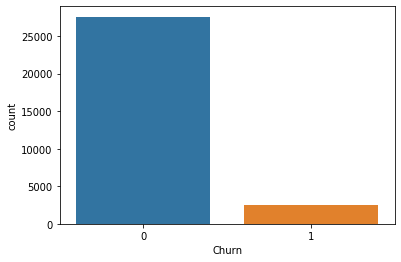

In [38]:
sns.countplot(filtered_data['Churn'])
plt.show()

- Category 0 (Not Churn) is much more in number than Category 1 (Churn).
- It needs to be addressed as it can lead to a biased model.

*Since we have to predict the `Churn` for the 9th month, therefore, the information pertaining to 9th month needs to be removed. Apart from that, redundant information like average recharge amount for months 6, 7 and total usage also needs removal.*

In [39]:
list(filtered_data.columns)

['mobile_number',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'arpu_9',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'onnet_mou_9',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'offnet_mou_9',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_ic_mou_9',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'roam_og_mou_9',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_t2c_mou_9',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_og_mou_9',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2f_mou_9',
 'std_

In [40]:
cols_to_drop_9 = ['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 
                  'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9',
                  'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9','og_others_9',
                  'total_og_mou_9','loc_ic_t2t_mou_9','loc_ic_t2m_mou_9','loc_ic_t2f_mou_9','loc_ic_mou_9','std_ic_t2t_mou_9',
                  'std_ic_t2m_mou_9','std_ic_t2f_mou_9','std_ic_mou_9','total_ic_mou_9','spl_ic_mou_9', 'isd_ic_mou_9',
                  'ic_others_9','total_rech_num_9','total_rech_amt_9','max_rech_amt_9','last_day_rch_amt_9','max_rech_data_9',
                  'count_rech_2g_9','count_rech_3g_9','vol_2g_mb_9','vol_3g_mb_9','arpu_3g_9','arpu_2g_9','monthly_2g_9',
                  'sachet_2g_9','monthly_3g_9','sachet_3g_9','fb_user_9','night_pck_user_9','sep_vbc_3g','total_amount_rech_data_9', 'total_amount_9',
                  'avg_amount_6_7','total_calls_use_9','total_data_use_9','total_usage']

cols_to_drop_9

['arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'last_day_rch_amt_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'count_rech_3g_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 'sachet_3g_9',
 'fb_user_9',
 'night_pck_user_9',
 'sep_vbc_3g',
 'total_amount_rech_data_9',
 'total_amount_9',
 'avg_amount_6_7',
 'total_calls_use_9',
 'total_data_use_9',
 'total_usa

In [41]:
filtered_data.drop(cols_to_drop_9, axis = 1, inplace = True)

In [45]:
list(filtered_data.columns)

['mobile_number',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_

- It can be observed that the columns pertaining to 9th Month are removed.

*Now the next step is Data Visualization in order to gain some insights from the data.*

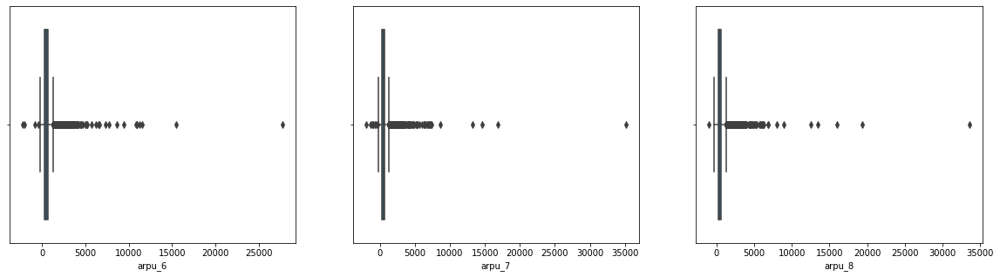

In [46]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['arpu_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['arpu_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['arpu_8'])
plt.show()

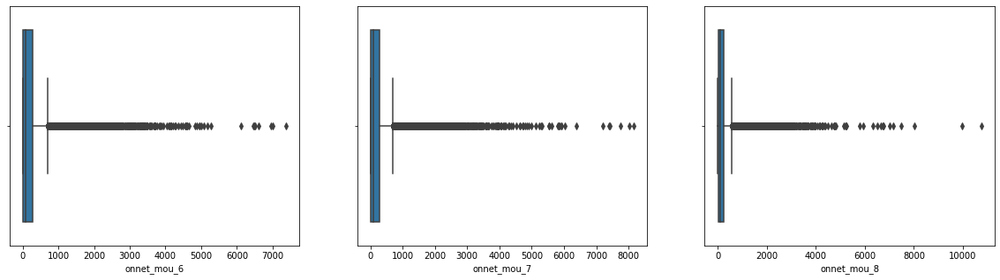

In [47]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['onnet_mou_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['onnet_mou_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['onnet_mou_8'])
plt.show()

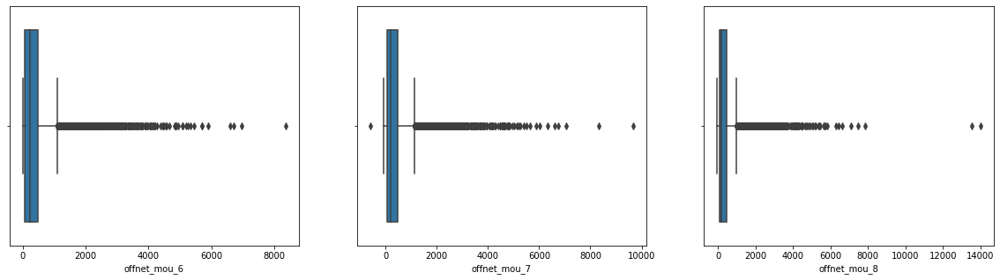

In [48]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['offnet_mou_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['offnet_mou_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['offnet_mou_8'])
plt.show()

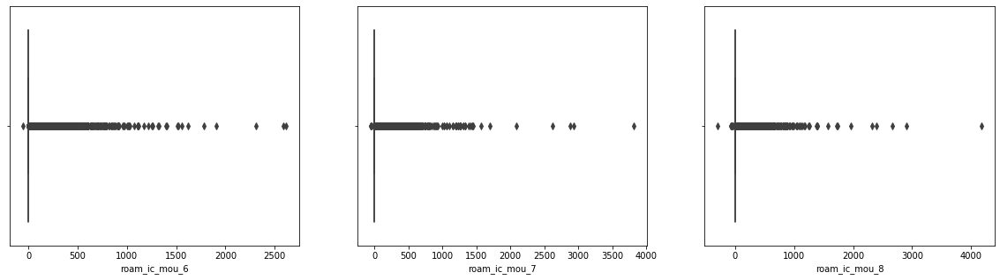

In [49]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['roam_ic_mou_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['roam_ic_mou_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['roam_ic_mou_8'])
plt.show()

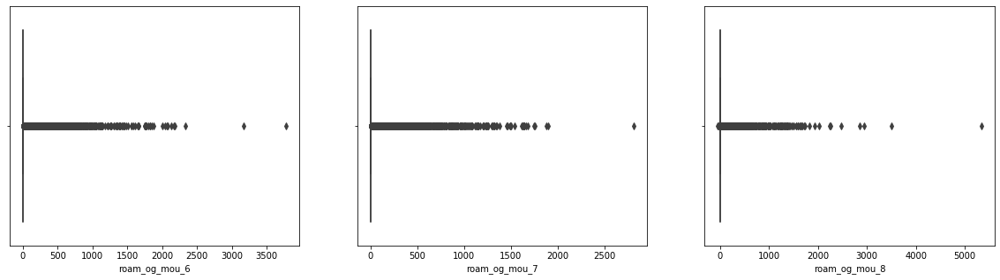

In [50]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['roam_og_mou_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['roam_og_mou_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['roam_og_mou_8'])
plt.show()

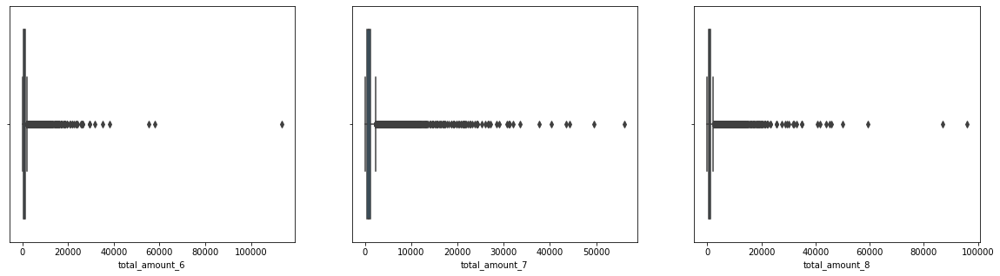

In [51]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
sns.boxplot(filtered_data['total_amount_6'])
plt.subplot(1,3,2)
sns.boxplot(filtered_data['total_amount_7'])
plt.subplot(1,3,3)
sns.boxplot(filtered_data['total_amount_8'])
plt.show()

- Huge presence of outliers can be observed in all columns.
- Outliers need to be treated.

*Let's use the* **capping** *method to address the outliers.*
- Selecting lower value as 5th percentile.
- Selecting upper value as 95th percentile.

In [52]:
def higher_quantile(x):
    if x > higher:
        return higher
    else:
        return x

def lower_quantile(x):
    if x < lower:
        return lower
    else:
        return x

for i in filtered_data.columns[1:-1]:
    higher = filtered_data[i].quantile(0.95)
    filtered_data[i] = filtered_data[i].apply(higher_quantile)

for i in filtered_data.columns[1:-1]:
    lower = filtered_data[i].quantile(0.05)
    filtered_data[i] = filtered_data[i].apply(lower_quantile)

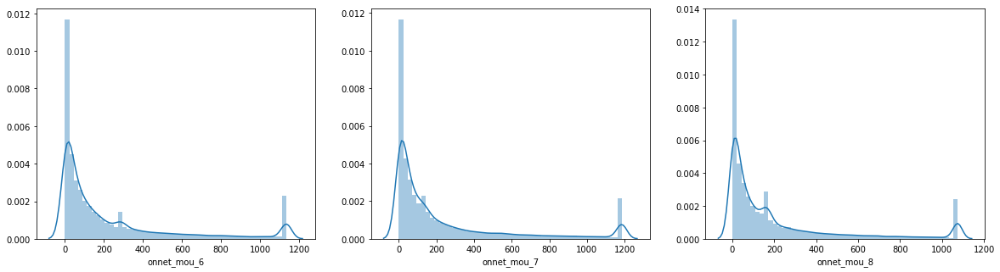

In [53]:
plt.figure(figsize = (20, 5))
plt.subplot(131)
sns.distplot(filtered_data['onnet_mou_6'])
plt.subplot(132)
sns.distplot(filtered_data['onnet_mou_7'])
plt.subplot(133)
sns.distplot(filtered_data['onnet_mou_8'])
plt.show()

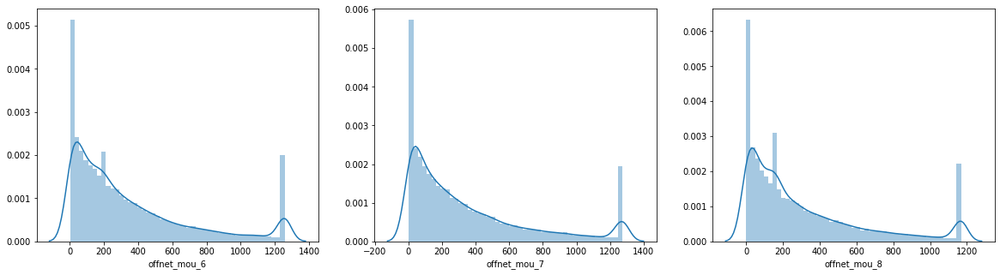

In [54]:
plt.figure(figsize = (20, 5))
plt.subplot(131)
sns.distplot(filtered_data['offnet_mou_6'])
plt.subplot(132)
sns.distplot(filtered_data['offnet_mou_7'])
plt.subplot(133)
sns.distplot(filtered_data['offnet_mou_8'])
plt.show()

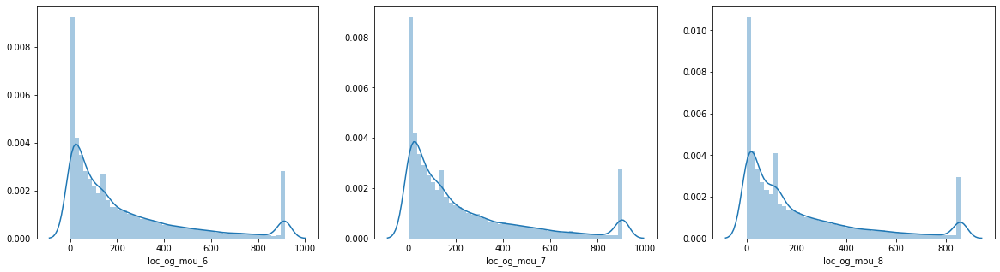

In [55]:
plt.figure(figsize = (20, 5))
plt.subplot(131)
sns.distplot(filtered_data['loc_og_mou_6'])
plt.subplot(132)
sns.distplot(filtered_data['loc_og_mou_7'])
plt.subplot(133)
sns.distplot(filtered_data['loc_og_mou_8'])
plt.show()

*Let's now correct the imbalance of the Target `Churn` column.*

In [56]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [57]:
filtered_data_X_smote,filtered_data_y_smote = smote.fit_sample(filtered_data.drop('Churn', axis = 1), 
                                                               filtered_data['Churn'])

In [58]:
filtered_data_smote = pd.concat([pd.DataFrame(filtered_data_X_smote), pd.DataFrame(filtered_data_y_smote)], axis = 1)
filtered_data_smote.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amount_rech_data_6,total_amount_rech_data_7,total_amount_rech_data_8,total_amount_6,total_amount_7,total_amount_8,Churn
0,7000842753,197.385,214.816,213.803,286.761251,133.019529,0.00,194.209333,22.417292,0.85,106.209775,36.488334,0.00,234.16,80.717482,0.00,57.484427,27.562047,0.00,84.252744,124.791666,0.00,0.363469,0.00,0.00,12.41,0.0,0.00,141.886173,134.385309,0.00,79.875562,72.234302,0.00,83.740974,7.996508,0.00,0.00,1.208374,0.00,155.691989,81.442983,0.00,0.7984,0.00,0.00,0.0,4.027858,0.00,0.0,0.0,0.0,0.00,0.00,0.00,59.090362,47.543106,0.16,96.948115,102.501255,4.13,12.081681,16.782578,1.15,167.927833,166.827402,5.44,0.00,10.305643,0.00,19.450138,21.656313,0.00,2.156706,0.790737,0.00,0.00,32.754237,0.00,1.26,2.44,5.44,0.00,0.0,0.0,4.970638,9.371677,0.00,0.064303,0.00,0.00,4.0,3.0,2.0,362.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1
1,7000701601,1069.180,1261.272,1255.019,57.840000,54.680000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.74,12.590000,38.06,51.390000,31.380000,40.28,308.630000,447.380000,162.28,30.430000,31.13,28.39,0.00,0.0,0.00,422.160000,533.910000,255.79,4.300000,23.290000,12.01,49.890000,31.760000,49.14,6.66,6.680000,5.93,60.860000,75.140000,77.84,0.0000,0.18,10.01,4.5,0.000000,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.140000,32.260000,27.31,217.560000,221.490000,121.19,71.560000,73.340000,39.53,427.880000,355.230000,188.04,36.89,11.830000,30.39,91.440000,122.090000,114.08,11.180000,11.530000,10.49,180.54,173.080000,181.08,626.46,558.04,428.74,0.21,0.0,0.0,2.060000,14.530000,31.59,3.410000,4.59,3.73,5.0,5.0,7.0,1480.0,790.0,1490.0,459.0,459.0,440.0,0.0,0.0,252.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

*Let's now check for the imbalance.*

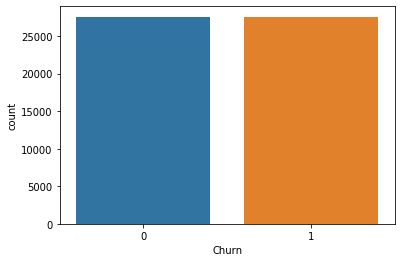

In [59]:
sns.countplot(filtered_data_smote['Churn'])
plt.show()

- It can be clearly observed that data imbalance has been corrected.

*Let's now head towards the* **Modelling** *part.*
- First, splitting the data into train and test sets.
- Scaling.
- Model Building.

*First, let's set the `mobile_numbers` as the index.*

In [60]:
filtered_data_smote.set_index('mobile_number', inplace = True)
filtered_data_smote.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amount_rech_data_6,total_amount_rech_data_7,total_amount_rech_data_8,total_amount_6,total_amount_7,total_amount_8,Churn
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7000842753,197.385,214.816,213.803,286.761251,133.019529,0.00,194.209333,22.417292,0.85,106.209775,36.488334,0.00,234.16,80.717482,0.00,57.484427,27.562047,0.00,84.252744,124.791666,0.00,0.363469,0.00,0.00,12.41,0.0,0.00,141.886173,134.385309,0.00,79.875562,72.234302,0.00,83.740974,7.996508,0.00,0.00,1.208374,0.00,155.691989,81.442983,0.00,0.7984,0.00,0.00,0.0,4.027858,0.00,0.0,0.0,0.0,0.00,0.00,0.00,59.090362,47.543106,0.16,96.948115,102.501255,4.13,12.081681,16.782578,1.15,167.927833,166.827402,5.44,0.00,10.305643,0.00,19.450138,21.656313,0.00,2.156706,0.790737,0.00,0.00,32.754237,0.00,1.26,2.44,5.44,0.00,0.0,0.0,4.970638,9.371677,0.00,0.064303,0.00,0.00,4.0,3.0,2.0,362.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1
7000701601,1069.180,1261.272,1255.019,57.840000,54.680000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.74,12.590000,38.06,51.390000,31.380000,40.28,308.630000,447.380000,162.28,30.430000,31.13,28.39,0.00,0.0,0.00,422.160000,533.910000,255.79,4.300000,23.290000,12.01,49.890000,31.760000,49.14,6.66,6.680000,5.93,60.860000,75.140000,77.84,0.0000,0.18,10.01,4.5,0.000000,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.140000,32.260000,27.31,217.560000,221.490000,121.19,71.560000,73.340000,39.53,427.880000,355.230000,188.04,36.89,11.830000,30.39,91.440000,122.090000,114.08,11.180000,11.530000,10.49,180.54,173.080000,181.08,626.46,558.04,428.74

- ### Train-Test Split

In [61]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(filtered_data_smote, train_size = 0.8, random_state = 100)

In [62]:
df_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amount_rech_data_6,total_amount_rech_data_7,total_amount_rech_data_8,total_amount_6,total_amount_7,total_amount_8,Churn
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002254815,465.809009,298.012775,176.073512,467.096540,267.949400,34.728561,170.280412,173.907494,31.630812,3.506581,0.000000,7.739393,11.199721,5.537489,11.151956,114.133892,82.948903,8.287914,87.870561,160.226817,15.419569,5.503108,1.746961,0.0,0.000000,0.000000,0.000000,212.682490,244.932681,21.913845,352.954456,181.713876,15.095073,58.292169,9.662848,17.649644,1.23517,0.000000,0.00000,413.350809,191.384915,31.493854,0.352237,0.000000,3.260608,0.142124,0.000000,0.641252,0.000000,0.0,0.0,626.537659,436.319405,0.000000,39.594863,73.840199,4.791410,66.074219,110.552956,9.568036,4.454208,0.335854,1.981739,110.133290,184.747201,16.980705,0.812427,5.512494,1.787806,15.885411,0.000000,0.000000,0.00000,0.000000,1.328730,16.699647,5.512494,0.000000,149.865690,201.743810,0.000000,0.049149,0.0,0.0,22.924454,11.484115,1.400169,0.040958,0.000000,0.0,9.457465,6.638310,3.819155,628.103557,540.957758,0.000000,173.114849,173.114849,0.000000,135.679967,90.107068,0.0,27.850105,27.850105,0.0,0.180845,0.180845,0.0,0.000000,0.000000,0.0,7.609951,2.029079,0.0,75.618461,3.016492,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.0,-0.819155,-0.819155,-1.0,0.180845,0.180845,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,-0.638310,-0.638310,-1.0,1706.578341,0.220631,3.235314,69.328678,27.850105,27.850105,0.0,655.953663,568.807863,0.000000,1
7001132479,441.084093,878.474738,100.014324,201.607276,221.062913,24.917862,498.767052,1098.958011,121.140371,0.000000,4.441377,9.775081,0.000000,21.689444,23.819299,116.117057,89.596609,15.818026,39.499723,144.035932,28.919630,1.242891,3.414746,0.0,0.000000,3.799145,0.224233,156.876078,237.053

In [63]:
df_test.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_amount_rech_data_6,total_amount_rech_data_7,total_amount_rech_data_8,total_amount_6,total_amount_7,total_amount_8,Churn
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002272426,177.523000,559.601000,390.617000,91.710000,87.760000,89.690000,73.430000,80.860000,143.710000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,91.710000,87.760000,89.690000,31.480000,46.430000,124.940000,30.430000,23.46000,17.59,0.000000,0.000000,0.000000,164.740000,157.660000,232.240000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,1.16,0.000000,0.250000,1.160000,0.0,0.0,0.000000,0.400000,11.690000,0.000000,0.00000,0.0,0.0,165.140000,169.610000,233.410000,119.960000,213.230000,217.830000,40.580000,11.260000,142.390000,15.060000,6.930000,7.490000,175.610000,231.430000,367.730000,0.000000,0.000000,0.200000,0.550000,0.310000,0.110000,11.18,11.530000,10.490000,147.740000,26.960000,51.030000,323.360000,258.390000,419.540000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.78,5.000000,8.000000,4.000000,210.000000,678.000000,457.000000,110.000000,154.000000,152.000000,50.000000,154.000000,152.000000,0.000000,154.0,152.0,0.000000,2.0,1.0,0.000000,0.0,1.0,0.000000,17.18,23.61,0.000000,1230.31,949.31,0.000000,88.05,113.69,0.000000,0.0,63.96,-1.000000,0.0,0.0,0.0,1.0,0.0,0.000000,0.0,1.0,0.000000,0.0,0.0,0.000000,0.0,1.0,-1.000000,1.0,1.0,2089.000000,0.00000,0.000000,0.000000,0.000000,616.0,608.0,241.000000,1294.000000,1065.000000,0
7000379685,459.973093,390.787217,378.581069,490.767975,162.094085,252.199400,271.379326,384.869603,309.209038,4.563568,1.126014,26.533101,5.846190,6.164105,26.563200,56.367224,55.781923,56.954237,42.068274,28.599410,19.769100,0.117456,0.00000,0.00,0.114324,1.855462,0.000000,98.554521,84.389767,76.731771,434.390750,104.521525,180.873769,221.274873,342

- ### Scaling

In [64]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

cols_to_scale = df_train.columns[:-1]

df_train[cols_to_scale] = scaler.fit_transform(df_train[cols_to_scale])
df_test[cols_to_scale] = scaler.transform(df_test[cols_to_scale])

In [65]:
X_train = df_train.drop('Churn', axis = 1)
y_train = df_train['Churn']

X_test = df_test.drop('Churn', axis = 1)
y_test = df_test['Churn']

## *Model Building*
Models for two purposes will be built.
- *For interpretability.*
- *Without interpretability with* **PCA.**

*Before that let's build a Logistic Regression model on the entire dataset to observe the performance.*

In [66]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()

logreg.fit(X_train, y_train)
logreg_predict_train = logreg.predict(X_train)

*Checking the accuracy and other metrics achieved for the test set as follows.*

In [67]:
print('The Accuracy of the model is:', round(accuracy_score(y_train, logreg_predict_train),3))
print('The Precision of the model is:', round(precision_score(y_train, logreg_predict_train),3))
print('The Recall of the model is:', round(recall_score(y_train, logreg_predict_train),3))

The Accuracy of the model is: 0.873
The Precision of the model is: 0.872
The Recall of the model is: 0.875


*Let's also calculate the Sensitivity, Specificity of the model on both Train and Test sets.*

In [68]:
confusion_matrix(y_train, logreg_predict_train)

array([[19280,  2835],
       [ 2753, 19228]], dtype=int64)

In [69]:
# Sensitivity
19228/(19228+2753)

0.8747554706337292

In [70]:
# Specificity
19280/(19280+2835)

0.8718064661994122

*Let's now use this model on test data and compute the metrics.*

In [71]:
logreg_predict_test = logreg.predict(X_test)

In [72]:
print('The Accuracy of the model is:', round(accuracy_score(y_test, logreg_predict_test),3))
print('The Precision of the model is:', round(precision_score(y_test, logreg_predict_test),3))
print('The Recall of the model is:', round(recall_score(y_test, logreg_predict_test),3))

The Accuracy of the model is: 0.875
The Precision of the model is: 0.878
The Recall of the model is: 0.875


In [73]:
confusion_matrix(y_test, logreg_predict_test)

array([[4764,  681],
       [ 699, 4880]], dtype=int64)

In [74]:
# Accuracy
(4764+4880)/(4764+4880+681+699)

0.8748185776487664

In [75]:
# Sensitivity
4880/(4880+699)

0.8747087291629324

In [76]:
# Specificity
4764/(4764+681)

0.874931129476584

- Both on the train and the test sets, it can be observed that Accuracy as well as other metrics obtained are of high value.

*Let's now build the model for* **Interpretability** *using* **RFE** *as follows.*

In [77]:
from sklearn.feature_selection import RFE
logreg_rfe = LogisticRegression()

rfe = RFE(logreg_rfe, 50)  # Slecting the best 50 Predictors.

rfe.fit(X_train, y_train)

RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                 fit_intercept=True, intercept_scaling=1,
                                 l1_ratio=None, max_iter=100,
                                 multi_class='auto', n_jobs=None, penalty='l2',
                                 random_state=None, solver='lbfgs', tol=0.0001,
                                 verbose=0, warm_start=False),
    n_features_to_select=50, step=1, verbose=0)

*Let's view the most influential 50 columns as follows.*

In [78]:
rfe_cols = list(X_train.columns[rfe.support_])
rfe_cols

['arpu_7',
 'onnet_mou_6',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_7',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_t2f_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_8',
 'std_ic_mou_7',
 'std_ic_mou_8',
 'total_ic_mou_8',
 'spl_ic_mou_8',
 'total_rech_num_8',
 'last_day_rch_amt_8',
 'max_rech_data_7',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'vol_3g_mb_8',
 'arpu_3g_8',
 'night_pck_user_7',
 'night_pck_user_8',
 'monthly_2g_7',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_7',
 'monthly_3g_8',
 'fb_user_7',
 'fb_user_8',
 'aon',
 'total_amount_8']

*In order to retain the original train set, let's make a new variables containing only the* **RFE** *columns as follows.*

In [79]:
rfe_X_train = X_train[rfe_cols]

*Let's begin the* **Model Building.**

In [80]:
import statsmodels.api as sm
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_1 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_1.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44045
Model Family:                Binomial   Df Model:                           50
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14174.
Date:                Wed, 13 May 2020   Deviance:                       28348.
Time:                        16:51:42   Pearson chi2:                 9.27e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0647      0

- Choosing the significance level as **0.05**, it can be observed that all the predictors are significant.

*Let's now calculate* **VIF** *values.*

In [81]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
35,count_rech_2g_7,204.64
42,sachet_2g_7,202.19
36,count_rech_2g_8,49.84
18,total_og_mou_7,44.42
27,loc_ic_mou_8,43.94
11,loc_og_mou_8,41.90
14,std_og_mou_7,40.28
43,sachet_2g_8,39.66
19,total_og_mou_8,39.49
46,fb_user_7,34.77


- Choosing the cut-off for **VIF** as 5.

*Dropping* `count_rech_2g_7`

In [82]:
rfe_X_train.drop('count_rech_2g_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_2 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_2.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44046
Model Family:                Binomial   Df Model:                           49
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14196.
Date:                Wed, 13 May 2020   Deviance:                       28392.
Time:                        16:53:03   Pearson chi2:                 9.45e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0603      0

In [83]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
35,count_rech_2g_8,49.61
18,total_og_mou_7,44.41
27,loc_ic_mou_8,43.94
11,loc_og_mou_8,41.90
14,std_og_mou_7,40.28
42,sachet_2g_8,39.50
19,total_og_mou_8,39.48
45,fb_user_7,34.76
15,std_og_mou_8,32.31
46,fb_user_8,31.38


- Dropping `count_rech_2g_8`

In [84]:
rfe_X_train.drop('count_rech_2g_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_3 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_3.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44047
Model Family:                Binomial   Df Model:                           48
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14238.
Date:                Wed, 13 May 2020   Deviance:                       28475.
Time:                        16:58:34   Pearson chi2:                 9.12e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0441      0

- Dropping `monthly_2g_7`.

In [85]:
rfe_X_train.drop('monthly_2g_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_3 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_3.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44048
Model Family:                Binomial   Df Model:                           47
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14238.
Date:                Wed, 13 May 2020   Deviance:                       28476.
Time:                        17:04:02   Pearson chi2:                 9.16e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0443      0

In [86]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
18,total_og_mou_7,44.36
27,loc_ic_mou_8,43.93
11,loc_og_mou_8,41.89
14,std_og_mou_7,40.25
19,total_og_mou_8,39.28
43,fb_user_7,34.69
15,std_og_mou_8,32.24
37,night_pck_user_7,30.87
44,fb_user_8,30.42
38,night_pck_user_8,27.20


- Dropping `total_og_mou_7`

In [87]:
rfe_X_train.drop('total_og_mou_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_4 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_4.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44049
Model Family:                Binomial   Df Model:                           46
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14245.
Date:                Wed, 13 May 2020   Deviance:                       28489.
Time:                        17:08:16   Pearson chi2:                 8.94e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0489      0

In [88]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
26,loc_ic_mou_8,43.91
11,loc_og_mou_8,41.85
42,fb_user_7,34.65
36,night_pck_user_7,30.86
18,total_og_mou_8,30.56
43,fb_user_8,30.40
15,std_og_mou_8,28.62
37,night_pck_user_8,27.17
25,loc_ic_mou_6,24.23
23,loc_ic_t2m_mou_8,20.87


- Dropping `loc_ic_mou_8`

In [89]:
rfe_X_train.drop('loc_ic_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_5 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_5.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44050
Model Family:                Binomial   Df Model:                           45
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14265.
Date:                Wed, 13 May 2020   Deviance:                       28531.
Time:                        17:10:34   Pearson chi2:                 8.94e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0549      0

- Dropping `total_ic_mou_8`

In [90]:
rfe_X_train.drop('total_ic_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_6 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_6.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44051
Model Family:                Binomial   Df Model:                           44
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14266.
Date:                Wed, 13 May 2020   Deviance:                       28532.
Time:                        17:12:03   Pearson chi2:                 8.94e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0564      0

In [91]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
11,loc_og_mou_8,41.15
40,fb_user_7,34.65
34,night_pck_user_7,30.86
41,fb_user_8,30.40
18,total_og_mou_8,30.16
15,std_og_mou_8,28.28
35,night_pck_user_8,27.17
3,offnet_mou_7,20.32
25,loc_ic_mou_6,19.93
8,loc_og_t2m_mou_8,17.03


- Dropping `loc_og_mou_8`

In [92]:
rfe_X_train.drop('loc_og_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_7 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_7.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44052
Model Family:                Binomial   Df Model:                           43
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14338.
Date:                Wed, 13 May 2020   Deviance:                       28677.
Time:                        17:14:02   Pearson chi2:                 9.73e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0641      0

- Dropping `loc_og_t2t_mou_8`

In [93]:
rfe_X_train.drop('loc_og_t2t_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_8 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_8.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44053
Model Family:                Binomial   Df Model:                           42
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14339.
Date:                Wed, 13 May 2020   Deviance:                       28678.
Time:                        17:16:14   Pearson chi2:                 9.81e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0626      0

- Dropping `loc_og_t2m_mou_8`

In [94]:
rfe_X_train.drop('loc_og_t2m_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_9 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_9.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44054
Model Family:                Binomial   Df Model:                           41
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14340.
Date:                Wed, 13 May 2020   Deviance:                       28680.
Time:                        17:18:15   Pearson chi2:                 9.76e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0651      0

In [95]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
37,fb_user_7,34.64
31,night_pck_user_7,30.85
38,fb_user_8,30.37
32,night_pck_user_8,27.15
22,loc_ic_mou_6,19.54
3,offnet_mou_7,18.79
15,total_og_mou_8,16.18
10,std_og_t2m_mou_7,15.16
12,std_og_mou_8,14.65
18,loc_ic_t2m_mou_6,13.28


- Dropping `fb_user_7`

In [96]:
rfe_X_train.drop('fb_user_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_10 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_10.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44055
Model Family:                Binomial   Df Model:                           40
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14375.
Date:                Wed, 13 May 2020   Deviance:                       28750.
Time:                        17:21:04   Pearson chi2:                 9.86e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0652      0

- Dropping `std_og_t2m_mou_7`

In [97]:
rfe_X_train.drop('std_og_t2m_mou_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_11 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_11.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44056
Model Family:                Binomial   Df Model:                           39
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14377.
Date:                Wed, 13 May 2020   Deviance:                       28754.
Time:                        17:23:11   Pearson chi2:                 9.87e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0654      0

- Dropping `loc_og_t2t_mou_7`

In [98]:
rfe_X_train.drop('loc_og_t2t_mou_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_12 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_12.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44057
Model Family:                Binomial   Df Model:                           38
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14378.
Date:                Wed, 13 May 2020   Deviance:                       28756.
Time:                        17:24:43   Pearson chi2:                 9.82e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0645      0

- Dropping `loc_og_mou_7`

In [99]:
rfe_X_train.drop('loc_og_mou_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_13 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_13.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44058
Model Family:                Binomial   Df Model:                           37
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14379.
Date:                Wed, 13 May 2020   Deviance:                       28758.
Time:                        17:26:11   Pearson chi2:                 9.93e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0647      0

In [100]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
34,fb_user_8,26.49
29,night_pck_user_8,24.25
19,loc_ic_mou_6,19.42
12,total_og_mou_8,14.29
15,loc_ic_t2m_mou_6,13.17
9,std_og_mou_8,12.30
11,total_og_mou_6,10.12
4,offnet_mou_8,8.32
25,max_rech_data_7,6.97
2,offnet_mou_6,6.77


- Dropping `fb_user_8`

In [101]:
rfe_X_train.drop('fb_user_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_14 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_14.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44059
Model Family:                Binomial   Df Model:                           36
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14404.
Date:                Wed, 13 May 2020   Deviance:                       28807.
Time:                        17:28:16   Pearson chi2:                 9.86e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0620      0

In [102]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
19,loc_ic_mou_6,19.42
12,total_og_mou_8,14.28
15,loc_ic_t2m_mou_6,13.17
9,std_og_mou_8,12.30
11,total_og_mou_6,10.12
4,offnet_mou_8,8.31
25,max_rech_data_7,6.86
2,offnet_mou_6,6.77
3,offnet_mou_7,6.67
8,std_og_mou_7,6.44


- Dropping `loc_ic_mou_6`

In [103]:
rfe_X_train.drop('loc_ic_mou_6', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_15 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_15.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44060
Model Family:                Binomial   Df Model:                           35
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14408.
Date:                Wed, 13 May 2020   Deviance:                       28817.
Time:                        17:30:35   Pearson chi2:                 1.00e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0615      0

In [104]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
12,total_og_mou_8,14.27
9,std_og_mou_8,12.28
11,total_og_mou_6,10.10
4,offnet_mou_8,8.30
24,max_rech_data_7,6.86
2,offnet_mou_6,6.75
3,offnet_mou_7,6.67
8,std_og_mou_7,6.44
7,std_og_t2t_mou_8,5.94
26,arpu_3g_8,5.88


- Dropping `total_og_mou_8`

In [105]:
rfe_X_train.drop('total_og_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_16 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_16.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44061
Model Family:                Binomial   Df Model:                           34
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14450.
Date:                Wed, 13 May 2020   Deviance:                       28901.
Time:                        17:32:25   Pearson chi2:                 9.84e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0637      0

In [106]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
9,std_og_mou_8,10.07
11,total_og_mou_6,9.86
23,max_rech_data_7,6.85
3,offnet_mou_7,6.67
2,offnet_mou_6,6.51
8,std_og_mou_7,6.40
4,offnet_mou_8,6.30
25,arpu_3g_8,5.85
7,std_og_t2t_mou_8,5.36
26,night_pck_user_7,5.20


- Dropping `std_og_mou_8`

In [107]:
rfe_X_train.drop('std_og_mou_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_17 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_17.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44062
Model Family:                Binomial   Df Model:                           33
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14474.
Date:                Wed, 13 May 2020   Deviance:                       28949.
Time:                        17:34:49   Pearson chi2:                 1.04e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0567      0

- Dropping `std_og_mou_7`

In [108]:
rfe_X_train.drop('std_og_mou_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_18 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_18.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44063
Model Family:                Binomial   Df Model:                           32
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14475.
Date:                Wed, 13 May 2020   Deviance:                       28949.
Time:                        17:36:36   Pearson chi2:                 1.03e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0561      0

In [109]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
9,total_og_mou_6,8.97
21,max_rech_data_7,6.83
2,offnet_mou_6,6.26
23,arpu_3g_8,5.85
24,night_pck_user_7,5.20
1,onnet_mou_6,5.09
3,offnet_mou_7,4.79
13,loc_ic_t2m_mou_7,4.63
31,total_amount_8,4.57
29,monthly_3g_8,4.27


- Dropping `total_og_mou_6`

In [110]:
rfe_X_train.drop('total_og_mou_6', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_19 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_19.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44064
Model Family:                Binomial   Df Model:                           31
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14493.
Date:                Wed, 13 May 2020   Deviance:                       28987.
Time:                        17:38:52   Pearson chi2:                 1.03e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0511      0

In [111]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
20,max_rech_data_7,6.83
22,arpu_3g_8,5.85
23,night_pck_user_7,5.20
3,offnet_mou_7,4.76
12,loc_ic_t2m_mou_7,4.62
30,total_amount_8,4.57
28,monthly_3g_8,4.27
13,loc_ic_t2m_mou_8,3.99
11,loc_ic_t2m_mou_6,3.70
26,sachet_2g_8,3.53


- Dropping `max_rech_data_7`

In [112]:
rfe_X_train.drop('max_rech_data_7', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_20 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_20.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44065
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14534.
Date:                Wed, 13 May 2020   Deviance:                       29068.
Time:                        17:41:29   Pearson chi2:                 1.01e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0501      0

In [113]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
21,arpu_3g_8,5.79
3,offnet_mou_7,4.73
12,loc_ic_t2m_mou_7,4.62
29,total_amount_8,4.53
27,monthly_3g_8,4.26
13,loc_ic_t2m_mou_8,3.99
11,loc_ic_t2m_mou_6,3.70
25,sachet_2g_8,3.49
4,offnet_mou_8,3.17
23,night_pck_user_8,2.92


- Dropping `arpu_3g_8`

In [114]:
rfe_X_train.drop('arpu_3g_8', axis = 1, inplace = True)
rfe_X_train_sm = sm.add_constant(rfe_X_train)
rfe_model_21 = sm.GLM(y_train, rfe_X_train_sm, family = sm.families.Binomial()).fit()
print(rfe_model_21.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                44096
Model:                            GLM   Df Residuals:                    44066
Model Family:                Binomial   Df Model:                           29
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14572.
Date:                Wed, 13 May 2020   Deviance:                       29144.
Time:                        17:43:35   Pearson chi2:                 9.65e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.0478      0

In [115]:
vif = pd.DataFrame()
vif['Features'] = rfe_X_train.columns
vif['VIF'] = [variance_inflation_factor(rfe_X_train.values, i) for i in range(rfe_X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = 'VIF', ascending = False)
vif

,Features,VIF
3,offnet_mou_7,4.73
12,loc_ic_t2m_mou_7,4.62
28,total_amount_8,4.03
13,loc_ic_t2m_mou_8,3.99
11,loc_ic_t2m_mou_6,3.70
24,sachet_2g_8,3.41
4,offnet_mou_8,3.15
22,night_pck_user_8,2.90
2,offnet_mou_6,2.65
21,night_pck_user_7,2.53


- **P-values** are under permissible limits (less than 0.05).
- **VIF** values are under permissible limits (less than 5).

*Let's now proceed towards the* **Probability of Predictions** *part.*

In [117]:
rfe_train_pred = pd.DataFrame({'Churn' : y_train, 
                               'Churn Probability' : rfe_model_21.predict(rfe_X_train_sm)})

In [118]:
rfe_train_pred.head()

,Churn,Churn Probability
mobile_number,,
7002254815,1,0.858145
7001132479,1,0.944792
7001655148,0,0.449987
7000746970,1,0.935796
7000989494,1,0.983074


*Let's first compute the* **ROC** *curve as follows.*

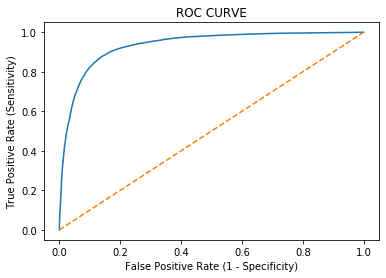

In [119]:
from sklearn.metrics import roc_curve
false_pr, true_pr, thresh = roc_curve(rfe_train_pred['Churn'], rfe_train_pred['Churn Probability'])
plt.plot(false_pr, true_pr)
plt.plot([0, 1], [0, 1], '--')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('ROC CURVE')
plt.show()

- **ROC** *curve suggests that the model is performing quite well.*

*Let's now compute the predictions for different cut-off values.*

In [120]:
num = [i/100 for i in range(100)]
for i in num:
    rfe_train_pred[i] = rfe_train_pred['Churn Probability'].apply(lambda x : 1 if x >= i else 0)
rfe_train_pred.head()

,Churn,Churn Probability,0.0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15,0.16,0.17,0.18,0.19,0.2,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38,0.39,0.4,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48,0.49,0.5,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59,0.6,0.61,0.62,0.63,0.64,0.65,0.66,0.67,0.68,0.69,0.7,0.71,0.72,0.73,0.74,0.75,0.76,0.77,0.78,0.79,0.8,0.81,0.82,0.83,0.84,0.85,0.86,0.87,0.88,0.89,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002254815,1,0.858145,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7001132479,1,0.944792,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0
7001655148,0,0.449987,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7000746970,1,0.935796,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0
7000989494,1,0.983074,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0


*Let's now formulate a table capturing the values of* **Accuracy, Sensitivity** *&* **Specificity** *as follows.*

In [121]:
diff_cutoffs = pd.DataFrame(columns = ['Cut-off','Accuracy','Sensitivity','Specificity'])
for i in num:
    cm = confusion_matrix(rfe_train_pred['Churn'], rfe_train_pred[i])
    total = sum(sum(cm))
    acc = (cm[0,0]+cm[1,1])/total
    sensi = cm[1,1]/(cm[1,1]+cm[1,0])
    speci = cm[0,0]/(cm[0,0]+cm[0,1])
    diff_cutoffs.loc[i] = [i, acc, sensi, speci]

In [122]:
diff_cutoffs

,Cut-off,Accuracy,Sensitivity,Specificity
0.00,0.00,0.498481,1.000000,0.000000
0.01,0.01,0.558032,0.997725,0.121004
0.02,0.02,0.598739,0.996179,0.203708
0.03,0.03,0.628447,0.994950,0.264165
0.04,0.04,0.652236,0.993085,0.313452
0.05,0.05,0.673667,0.991129,0.358128
0.06,0.06,0.692126,0.989354,0.396699
0.07,0.07,0.708341,0.987216,0.431155
0.08,0.08,0.722242,0.985578,0.460502
0.09,0.09,0.733513,0.983850,0.484694


*Plotting the above as follows.*

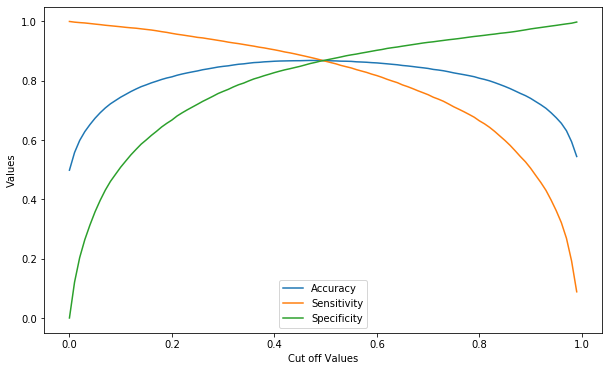

In [123]:
diff_cutoffs.plot.line(x='Cut-off', y=['Accuracy', 'Sensitivity', 'Specificity'], figsize=(10,6))
plt.xlabel('Cut off Values')
plt.ylabel('Values')
plt.show()

- **Cut-off = 0.50** seems to be the optimal value.

In [124]:
rfe_train_pred[['Churn', 'Churn Probability', 0.50]]

,Churn,Churn Probability,0.5
mobile_number,,,
7002254815,1,0.858145,1
7001132479,1,0.944792,1
7001655148,0,0.449987,0
7000746970,1,0.935796,1
7000989494,1,0.983074,1
7000506752,1,0.958497,1
7000163117,0,0.116755,0
7000988325,1,0.263946,0
7002298070,1,0.837836,1


*Let's now apply this* **Cut-off = 0.50** *on the test data as follows.*

In [125]:
rfe_X_test = X_test[rfe_X_train.columns]
rfe_X_test.head()

,arpu_7,onnet_mou_6,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_og_mou_8,loc_og_mou_6,std_og_t2t_mou_8,isd_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,vol_3g_mb_8,night_pck_user_7,night_pck_user_8,sachet_2g_7,sachet_2g_8,monthly_3g_7,monthly_3g_8,aon,total_amount_8
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002272426,0.150136,-0.567016,-0.869866,-0.741645,-0.358007,-0.622460,-0.154133,-0.512816,-0.552016,1.303226,3.674129,-0.638181,-0.839113,0.430902,-0.061582,-0.163185,0.727305,-0.219641,-0.530763,1.323540,1.912893,1.116461,1.373064,-0.505039,0.308755,-0.406232,-0.333618,1.285910,0.649196
7000379685,-0.435010,0.700705,-0.286635,0.156651,0.240499,0.378105,-0.448243,0.397612,-0.552016,-0.288885,-0.135595,-0.736635,-0.678991,-0.488871,-0.550342,-0.692375,-0.286437,-0.219641,0.125350,0.401861,-0.419890,-1.031489,-0.802155,-0.505039,-0.412688,-0.406232,-0.333618,-0.456151,-0.071232
7001274496,-1.387202,-0.846192,2.616216,-0.816786,-0.297523,0.089758,0.242114,-0.092622,2.378609,-0.804983,-0.181414,-0.671599,-0.858190,-0.347506,0.185623,-0.737645,-0.538797,-0.219641,-0.997530,-0.747010,-0.419890,-1.031489,-0.802155,-0.505039,-0.412688,-0.406232,-0.333618,-0.997478,-0.875251
7000668042,0.363338,-0.208315,-0.746277,-0.711415,-0.856544,0.063418,-0.405828,-0.479827,-0.552016,-0.325323,-0.714412,-0.652971,-0.832312,-0.736656,-0.595426,-0.545711,-0.536848,-0.219641,-0.469158,-0.628162,-0.419890,-1.031489,-0.802155,-0.505039,-0.412688,-0.406232,-0.333618,-0.576179,-0.795574
7002186602,-0.093942,1.881124,1.262864,0.164802,0.206408,-0.247776,-0.393588,0.249095,0.083236,0.057886,-0.414747,0.760311,0.016975,-0.514378,-0.426109,-0.383508,-0.329311,-0.219641,0.099237,-0.747010,-0.419890,-1.031489,-0.802155,-0.505039,-0.412688,-0.406232,-0.333618,-0.510378,-0.163334


In [126]:
rfe_X_test_sm = sm.add_constant(rfe_X_test)

In [127]:
rfe_test_pred = pd.DataFrame({'Churn' : y_test,
                              'Churn Probability' : rfe_model_21.predict(rfe_X_test_sm)})

In [128]:
rfe_test_pred.head()

,Churn,Churn Probability
mobile_number,,
7002272426,0,0.005936
7000379685,1,0.467756
7001274496,1,0.981511
7000668042,1,0.843247
7002186602,1,0.924608


In [129]:
rfe_test_pred['Predicted'] = rfe_test_pred['Churn Probability'].apply(lambda x : 1 if x >= 0.50 else 0)

In [130]:
rfe_test_pred.head()

,Churn,Churn Probability,Predicted
mobile_number,,,
7002272426,0,0.005936,0
7000379685,1,0.467756,0
7001274496,1,0.981511,1
7000668042,1,0.843247,1
7002186602,1,0.924608,1


*Let's now compute the values of* **Accuracy, Sensitivity** *&* **Specificity.**

In [131]:
confusion_matrix(rfe_test_pred['Churn'], rfe_test_pred['Predicted'])

array([[4752,  693],
       [ 747, 4832]], dtype=int64)

In [132]:
# Accuracy
accuracy_score(rfe_test_pred['Churn'], rfe_test_pred['Predicted'])

0.8693759071117562

In [133]:
# Sensitivity
4832/(4832+747)

0.8661050367449363

In [134]:
# Specificity
4752/(4752+693)

0.8727272727272727

- It can be observed from the metrics that the model is performing well.

*Let's now make the model using* **Principal Component Analysis.**

In [135]:
from sklearn.decomposition import PCA
pca = PCA(random_state=100)

In [136]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=100,
    svd_solver='auto', tol=0.0, whiten=False)

*Let's now observe the* **Principal Components.**

In [137]:
components = pca.components_
components

array([[-2.87308359e-02,  3.65296262e-03,  6.66093725e-02, ...,
         6.22951619e-02,  9.51785734e-02,  1.20491500e-01],
       [ 1.15474966e-01,  1.43672545e-01,  1.43614102e-01, ...,
        -7.46247219e-03,  1.28157524e-02,  5.22152427e-02],
       [ 6.64282784e-02,  1.44413008e-01,  1.38485006e-01, ...,
         4.77792754e-02,  1.24934430e-01,  1.33046743e-01],
       ...,
       [ 1.38015990e-03, -5.52335392e-03,  4.63102705e-03, ...,
        -1.63702888e-03,  3.45986600e-03, -4.49964537e-03],
       [-0.00000000e+00,  3.60211827e-16,  1.55423084e-16, ...,
        -5.53116451e-16,  2.40614692e-16, -2.75547267e-17],
       [ 0.00000000e+00, -3.45688425e-18,  4.18067563e-16, ...,
        -1.00941208e-16, -1.48316447e-16, -6.52258182e-17]])

In [138]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

*Let's now visualize the* **Scree** *plot to determine the number of Principal Components.*

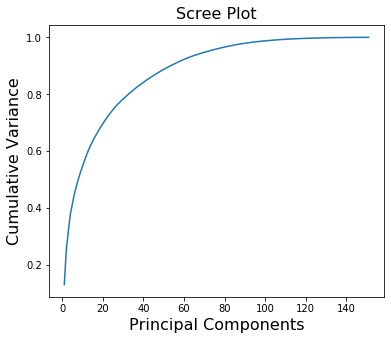

In [139]:
plt.figure(figsize=(6,5))
sns.lineplot(range(1, len(cumulative_variance)+1), cumulative_variance)
plt.xlabel('Principal Components', fontsize=16)
plt.ylabel('Cumulative Variance', fontsize=16)
plt.title('Scree Plot', fontsize=16)
plt.show()

- It can be observed that the first 80 Principal Components explain more than 90% variance of the data. Theerefore, taking the number of components as 80.

In [140]:
pca_2 = PCA(n_components=80, random_state=100)

In [141]:
df_pca_train = pd.DataFrame(pca_2.fit_transform(X_train))
df_pca_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79
0,-2.851813,-1.241665,-2.325797,-1.884585,-1.533169,-0.487037,0.800660,-0.408719,-0.376492,0.579376,0.656019,0.998484,-0.918352,-1.582783,-0.750601,-0.312384,-0.044737,-0.202011,-0.692089,-0.907373,0.085839,-0.305682,0.405567,-0.307001,0.060388,-0.258218,-0.117134,-0.579242,0.472998,0.414803,0.141387,-0.208692,0.317369,0.202192,-0.397912,-0.004537,0.032908,-0.248433,-0.350984,-0.290688,0.211181,0.390543,-0.166860,-0.182988,-0.819180,-0.435531,0.033230,0.141198,-0.832463,-0.614814,0.573196,-0.066670,0.150061,0.028036,-0.231212,-0.467815,-0.056664,0.219570,0.836555,-1.178167,-0.440803,0.166045,0.331351,-1.238647,-0.106518,0.000526,-0.310892,0.057613,-0.235995,-0.323560,0.310040,-0.337398,-0.433877,0.144149,-0.133273,0.333876,-0.080246,-0.152184,-0.334152,-0.307104
1,-3.524132,0.269408,0.448587,-0.894055,-0.103206,-1.173656,-2.601027,-0.700215,-1.074033,1.162085,3.277182,-0.212985,-0.536124,-1.803555,-0.937643,0.283027,-0.400474,0.466652,-2.206700,-0.442015,2.147123,-0.314223,-0.077069,0.002825,0.610358,-0.281718,0.142107,-0.956550,0.091142,-0.130939,-1.158906,0.370040,0.416396,-0.422414,0.101474,1.132643,0.203254,1.733247,0.821673,0.090722,0.037181,-0.772515,-0.149934,1.061504,-0.966491,0.379209,0.695229,-0.003521,1.000360,-1.292246,0.643086,-1.080290,-0.195408,-0.709945,-0.160816,0.333464,0.875191,0.331468,-0.107365,0.110711,0.443032,-0.741378,0.677662,-0.790036,0.285798,0.126457,-0.147160,-0.169714,0.345376,-0.335575,-0.520413,1.189720,-0.389988,0.086854,0.326296,-0.189661,0.285229,-0.138560,-0.172602,0.529131
2,-0.370924,-2.614017,-3.291478,0.154897,-2.696228,-3.153823,0.211400,-1.384920,-1.603176,1.241880,-0.172662,-1.106309,0.063695,-1.021196,1.184718,-0.345511,-0.206296,-0.267646,0.649558,-0.417352,-0.729354,0.209395,1.857551,0.670881,-0.228067,-0.170435,-0.173462,-0.102086,0.056695,-0.507614,0.147143,0.575952,-0.614663,-0.775233,-0.027944,0.672146,0.084375,-0.064312,-1.108110,-0.063410,1.325829,1.303769,-1.611276,0.549920,-1.706705,-0.611811,-0.568177,-0.248616,0.286893,-0.449172,0.091783,0.397655,-0.129624,-0.305282,-0.578254,-0.006324,0.945427,0.737238,-0.180791,-0.003904,-0.110650,0.152028,-0.167196,0.075075,-0.051078,-0.463830,-0.335633,-0.168836,0.288850,0.719394,-0.124519,0.019324,0.303904,-0.899275,-0.047287,0.340447,-0.098062,0.394375,-0.256871,0.005039
3,-4.924320,-2.381718,0.854152,-2.002270,-0.457351,-0.364282,1.287926,2.370009,-0.807527,1.284577,-0.959337,-0.679353,0.605793,0.046988,1.773663,-1.228849,0.338810,-0.482294,-1.055782,0.040192,1.601196,-0.436371,-0.539678,-2.751289,2.471617,0.037698,1.532077,-0.978292,1.791635,-0.004981,0.030885,0.683819,0.148429,0.022822,-0.294458,-0.668215,-0.163550,-0.606346,-0.005938,0.691462,-0.053336,0.263100,0.065703,-0.477148,0.017542,-0.382022,0.446577,0.006116,-0.455884,0.867853,-0.527326,0.208581,-0.280340,0.494504,-0.191372,0.156370,0.847892,0.038018,0.217131,1.881379,-0.200300,-0.743120,0.281511,0.202087,-0.762705,0.032490,0.210176,-0.475455,-1.226285,0.430015,-0.129619,-1.489477,-0.053568,0.455872,-0.150730,0.589923,0.178730,-0.522442,0.123050,0.447286
4,-4.010854,-0.226115,-2.019118,-1.125258,0.089243,3.475252,-0.206178,-0.776316,-0.921714,1.708761,0.449006,1.596940,-1.572814,1.299797,1.191820,-0.241616,0.265551,-0.112027,1.417598,1.957712,-0.468839,-0.466327,0.067932,-0.925286,0.925868,0.943410,0.005408,-0.657374,-0.128931,-1.270870,0.760392,0.388346,-1.047630,-0.292373,-0.674031,0.157804,-0.334321,0.127264,0.212201,0.216399,-0.853569,0.309127,-0.683754,-0.687545,-1.091326,1.192802,2.474545,-0.180666,-0.305729,0.253492,0.239508,0.075078,-0.530304,0.379572,-0.184358,0.398057,0.220829,-0.136744,-0.195266,-0.431797,-0.639224,0.090633,0.013277,0.559659,0.509883,-0.676941,-0.166665,0.301656,0.828073,0.607315,0.316436,0.564175,-0.329676,0.538766

In [142]:
df_pca_train['Churn'] = y_train.reset_index(drop = True)

In [143]:
df_pca_train.set_index(X_train.index, inplace = True)

In [144]:
df_pca_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,Churn
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002254815,-2.851813,-1.241665,-2.325797,-1.884585,-1.533169,-0.487037,0.800660,-0.408719,-0.376492,0.579376,0.656019,0.998484,-0.918352,-1.582783,-0.750601,-0.312384,-0.044737,-0.202011,-0.692089,-0.907373,0.085839,-0.305682,0.405567,-0.307001,0.060388,-0.258218,-0.117134,-0.579242,0.472998,0.414803,0.141387,-0.208692,0.317369,0.202192,-0.397912,-0.004537,0.032908,-0.248433,-0.350984,-0.290688,0.211181,0.390543,-0.166860,-0.182988,-0.819180,-0.435531,0.033230,0.141198,-0.832463,-0.614814,0.573196,-0.066670,0.150061,0.028036,-0.231212,-0.467815,-0.056664,0.219570,0.836555,-1.178167,-0.440803,0.166045,0.331351,-1.238647,-0.106518,0.000526,-0.310892,0.057613,-0.235995,-0.323560,0.310040,-0.337398,-0.433877,0.144149,-0.133273,0.333876,-0.080246,-0.152184,-0.334152,-0.307104,1
7001132479,-3.524132,0.269408,0.448587,-0.894055,-0.103206,-1.173656,-2.601027,-0.700215,-1.074033,1.162085,3.277182,-0.212985,-0.536124,-1.803555,-0.937643,0.283027,-0.400474,0.466652,-2.206700,-0.442015,2.147123,-0.314223,-0.077069,0.002825,0.610358,-0.281718,0.142107,-0.956550,0.091142,-0.130939,-1.158906,0.370040,0.416396,-0.422414,0.101474,1.132643,0.203254,1.733247,0.821673,0.090722,0.037181,-0.772515,-0.149934,1.061504,-0.966491,0.379209,0.695229,-0.003521,1.000360,-1.292246,0.643086,-1.080290,-0.195408,-0.709945,-0.160816,0.333464,0.875191,0.331468,-0.107365,0.110711,0.443032,-0.741378,0.677662,-0.790036,0.285798,0.126457,-0.147160,-0.169714,0.345376,-0.335575,-0.520413,1.189720,-0.389988,0.086854,0.326296,-0.189661,0.285229,-0.138560,-0.172602,0.529131,1
7001655148,-0.370924,-2.614017,-3.291478,0.154897,-2.696228,-3.153823,0.211400,-1.384920,-1.603176,1.241880,-0.172662,-1.106309,0.063695,-1.021196,1.184718,-0.345511,-0.206296,-0.267646,0.649558,-0.417352,-0.729354,0.209395,1.857551,0.670881,-0.228067,-0.170435,-0.173462,-0.102086,0.056695,-0.507614,0.147143,0.575952,-0.614663,-0.775233,-0.027944,0.672146,0.084375,-0.064312,-1.108110,-0.063410,1.325829,1.303769,-1.611276,0.549920,-1.706705,-0.611811,-0.568177,-0.248616,0.286893,-0.449172,0.091783,0.397655,-0.129624,-0.305282,-0.578254,-0.006324,0.945427,0.737238,-0.180791,-0.003904,-0.110650,0.152028,-0.167196,0.075075,-0.051078,-0.463830,-0.335633,-0.168836,0.288850,0.719394,-0.124519,0.019324,0.303904,-0.899275,-0.047287,0.340447,-0.098062,0.394375,-0.256871,0.005039,0
7000746970,-4.924320,-2.381718,0.854152,-2.002270,-0.457351,-0.364282,1.287926,2.370009,-0.807527,1.284577,-0.959337,-0.679353,0.605793,0.046988,1.773663,-1.228849,0.338810,-0.482294,-1.055782,0.040192,1.601196,-0.436371,-0.539678,-2.751289,2.471617,0.037698,1.532077,-0.978292,1.791635,-0.004981,0.030885,0.683819,0.148429,0.022822,-0.294458,-0.668215,-0.163550,-0.606346,-0.005938,0.691462,-0.053336,0.263100,0.065703,-0.477148,0.017542,-0.382022,0.446577,0.006116,-0.455884,0.867853,-0.527326,0.208581,-0.280340,0.494504,-0.191372,0.156370,0.847892,0.038018,0.217131,1.881379,-0.200300,-0.743120,0.281511,0.202087,-0.762705,0.032490,0.210176,-0.475455,-1.226285,0.430015,-0.129619,-1.489477,-0.053568,0.455872,-0.150730,0.589923,0.178730,-0.522442,0.123050,0.447286,1
7000989494,-4.010854,-0.226115,-2.019118,-1.125258,0.089243,3.475252,-0.206178,-0.776316,-0.921714,1.708761,0.449006,1.596940,-1.572814,1.299797,1.191820,-0.241616,0.265551,-0.112027,1.417598,1.957712,-0.468839,-0.466327,0.067932,-0.925286,0.925868,0.943410,0.005408,-0.657374,-0.128931,-1.270870,0.760392,0.388346,-1.047630,-0.292373,-0.674031,0.157804,-0.334321,0.127264,0.212201,0.216399,-0.853569,0.309127,-0.683754,-0.687545,-1.091326,1.192802,2.474545,-0.180666,-0.305729,0.253492,0.239508,0.075078,-0.530304,0.379572,-0.184358,0.398057,0.220829,-0.13

*Let's now also perform the transformations on the test set as follows.*

In [145]:
df_pca_test = pd.DataFrame(pca_2.transform(X_test))
df_pca_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79
0,5.044296,1.604281,-2.324629,0.744018,-0.569911,-4.099087,1.328190,-0.300209,-1.596547,1.725164,-0.359914,2.649055,1.579715,0.818655,-2.381392,3.134079,2.703710,1.801817,-0.888890,-1.093863,0.596572,1.400672,-0.051431,-0.581118,-0.152125,1.594781,0.361379,0.584206,-0.349369,-1.123910,-0.193111,0.861965,-1.465552,0.182800,1.182301,1.669112,0.682489,-0.529823,-0.534255,3.613885,4.151544,-2.668481,-1.259371,1.539137,-2.597047,-1.270800,-0.781635,-2.623227,0.210391,-0.022633,0.244572,-1.224896,-0.118725,0.547388,-0.285947,1.019083,-1.723015,-0.491847,0.696603,-0.192166,-0.216929,-1.529609,-1.300402,-0.237219,-0.394684,-0.277574,0.723105,0.511944,-0.565358,-0.320062,-1.608546,0.227902,0.990800,0.267712,-0.014982,0.082845,-0.540646,0.294610,0.642332,-1.068727
1,-4.065084,-0.490449,0.673996,-0.384140,-1.894915,-0.749832,0.256301,-0.497093,0.272690,-0.690779,-1.071515,0.021668,0.064100,-0.031096,-0.683422,0.053776,0.122559,0.463359,-0.232446,-0.403082,-0.467231,0.742348,0.339655,0.815859,-0.680430,0.062561,0.065377,0.438839,-0.751165,-0.575850,0.454676,0.317335,0.281325,0.184347,0.021848,0.023782,0.325565,0.007601,-0.156341,0.451590,-0.741350,-0.308993,-0.677705,0.130041,0.255463,-0.256792,0.430610,0.446791,-0.209066,-0.645104,0.317162,0.020321,0.379689,0.185196,0.476234,0.321079,0.136494,0.024209,0.073429,-0.652610,0.103193,0.445649,-0.173919,-0.405916,0.309207,0.119005,-0.126236,0.180017,0.005513,-0.129081,-0.036038,0.655575,-0.270500,-0.067983,0.270103,-0.374647,-0.384751,0.289071,0.233273,-0.222838
2,-5.157175,-2.003454,-1.633102,-2.647828,0.224645,1.987026,-2.258501,0.040199,1.291557,0.215501,-1.681399,0.956687,-0.661938,0.488182,-0.573069,1.908024,1.332168,-1.470572,2.754756,0.001742,-0.723325,0.590038,-0.712541,-0.474462,-1.145340,0.738349,1.841249,0.692433,0.179893,0.162925,-0.403262,0.050526,-0.624523,-0.287122,-0.216637,-0.612860,0.519840,0.626450,-0.085131,-0.319593,0.496951,-0.364309,-0.031297,0.661845,0.397746,1.053341,-0.876706,-0.280256,1.972147,0.225473,-0.440017,-0.097237,-0.845661,0.228739,0.043052,-0.627788,-0.239555,-0.479759,-0.052552,0.239815,-0.524654,0.297810,-0.806159,-0.069189,0.244738,-0.141230,0.278791,-0.235873,-0.460065,-0.231536,0.272402,-1.367890,0.266022,-0.121706,0.092550,-0.177552,-0.454836,0.018491,-0.109195,-0.047298
3,-2.746196,-2.281498,-0.838416,-3.807321,-1.551859,-2.039531,-0.186240,1.695466,0.695777,1.546057,-0.049481,0.808093,1.360939,-0.050741,0.617711,-2.146510,0.461826,1.031350,-1.414073,-0.316772,-1.336444,-0.218812,1.078486,0.519861,-0.547712,0.719994,0.539118,-0.132213,-0.038280,0.099668,0.170933,-0.587855,1.356754,0.169872,-0.840162,0.565006,-0.622992,1.381703,-1.423479,0.749101,0.070150,0.538422,1.342905,1.468329,0.282846,1.358161,-0.471126,-0.667337,-1.679735,-0.234993,-0.265282,0.650042,0.071280,-0.125576,0.157484,-1.138793,0.315575,0.008497,0.179651,0.758318,-0.092626,0.541622,0.726878,-0.684651,0.480792,0.340037,0.898815,0.699610,-0.060698,-0.219942,-0.269682,-0.036938,-0.717483,-0.188892,0.078066,-0.312311,0.301469,-1.223261,-0.167506,-0.575540
4,-4.678440,1.482589,1.441680,-1.831495,0.766364,2.545692,-0.014817,0.879997,1.506161,0.857024,-0.418952,0.840505,-1.572698,1.038173,0.721250,0.366151,-0.035136,0.451327,1.022697,-0.223406,-0.847068,0.709897,0.793612,0.313204,-1.629194,-1.745422,1.675722,0.591511,1.496688,1.325905,-1.325879,-0.429150,0.204078,-0.968563,0.623089,-0.255267,-0.998162,-0.145986,-1.263731,-0.930539,0.722293,-0.630027,0.137744,0.754519,0.482891,-0.334628,0.272033,0.001684,-0.306794,0.205942,-1.478061,-0.158191,-0.629553,0.094949,0.650069,-0.217006,0.150950,-0.006031,-1.180225,-0.099746,-0.922473,0.815114,-0.357815,1.071620,1.217342,-0.650096,0.970416,-0.135528,0.932932,0.713335,-0.674319,-0.275203,-0.377303,-0.195472,-1.045244,-0.786

In [146]:
df_pca_test['Churn'] = y_test.reset_index(drop = True)

In [147]:
df_pca_test.set_index(X_test.index, inplace = True)

In [148]:
df_pca_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,Churn
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7002272426,5.044296,1.604281,-2.324629,0.744018,-0.569911,-4.099087,1.328190,-0.300209,-1.596547,1.725164,-0.359914,2.649055,1.579715,0.818655,-2.381392,3.134079,2.703710,1.801817,-0.888890,-1.093863,0.596572,1.400672,-0.051431,-0.581118,-0.152125,1.594781,0.361379,0.584206,-0.349369,-1.123910,-0.193111,0.861965,-1.465552,0.182800,1.182301,1.669112,0.682489,-0.529823,-0.534255,3.613885,4.151544,-2.668481,-1.259371,1.539137,-2.597047,-1.270800,-0.781635,-2.623227,0.210391,-0.022633,0.244572,-1.224896,-0.118725,0.547388,-0.285947,1.019083,-1.723015,-0.491847,0.696603,-0.192166,-0.216929,-1.529609,-1.300402,-0.237219,-0.394684,-0.277574,0.723105,0.511944,-0.565358,-0.320062,-1.608546,0.227902,0.990800,0.267712,-0.014982,0.082845,-0.540646,0.294610,0.642332,-1.068727,0
7000379685,-4.065084,-0.490449,0.673996,-0.384140,-1.894915,-0.749832,0.256301,-0.497093,0.272690,-0.690779,-1.071515,0.021668,0.064100,-0.031096,-0.683422,0.053776,0.122559,0.463359,-0.232446,-0.403082,-0.467231,0.742348,0.339655,0.815859,-0.680430,0.062561,0.065377,0.438839,-0.751165,-0.575850,0.454676,0.317335,0.281325,0.184347,0.021848,0.023782,0.325565,0.007601,-0.156341,0.451590,-0.741350,-0.308993,-0.677705,0.130041,0.255463,-0.256792,0.430610,0.446791,-0.209066,-0.645104,0.317162,0.020321,0.379689,0.185196,0.476234,0.321079,0.136494,0.024209,0.073429,-0.652610,0.103193,0.445649,-0.173919,-0.405916,0.309207,0.119005,-0.126236,0.180017,0.005513,-0.129081,-0.036038,0.655575,-0.270500,-0.067983,0.270103,-0.374647,-0.384751,0.289071,0.233273,-0.222838,1
7001274496,-5.157175,-2.003454,-1.633102,-2.647828,0.224645,1.987026,-2.258501,0.040199,1.291557,0.215501,-1.681399,0.956687,-0.661938,0.488182,-0.573069,1.908024,1.332168,-1.470572,2.754756,0.001742,-0.723325,0.590038,-0.712541,-0.474462,-1.145340,0.738349,1.841249,0.692433,0.179893,0.162925,-0.403262,0.050526,-0.624523,-0.287122,-0.216637,-0.612860,0.519840,0.626450,-0.085131,-0.319593,0.496951,-0.364309,-0.031297,0.661845,0.397746,1.053341,-0.876706,-0.280256,1.972147,0.225473,-0.440017,-0.097237,-0.845661,0.228739,0.043052,-0.627788,-0.239555,-0.479759,-0.052552,0.239815,-0.524654,0.297810,-0.806159,-0.069189,0.244738,-0.141230,0.278791,-0.235873,-0.460065,-0.231536,0.272402,-1.367890,0.266022,-0.121706,0.092550,-0.177552,-0.454836,0.018491,-0.109195,-0.047298,1
7000668042,-2.746196,-2.281498,-0.838416,-3.807321,-1.551859,-2.039531,-0.186240,1.695466,0.695777,1.546057,-0.049481,0.808093,1.360939,-0.050741,0.617711,-2.146510,0.461826,1.031350,-1.414073,-0.316772,-1.336444,-0.218812,1.078486,0.519861,-0.547712,0.719994,0.539118,-0.132213,-0.038280,0.099668,0.170933,-0.587855,1.356754,0.169872,-0.840162,0.565006,-0.622992,1.381703,-1.423479,0.749101,0.070150,0.538422,1.342905,1.468329,0.282846,1.358161,-0.471126,-0.667337,-1.679735,-0.234993,-0.265282,0.650042,0.071280,-0.125576,0.157484,-1.138793,0.315575,0.008497,0.179651,0.758318,-0.092626,0.541622,0.726878,-0.684651,0.480792,0.340037,0.898815,0.699610,-0.060698,-0.219942,-0.269682,-0.036938,-0.717483,-0.188892,0.078066,-0.312311,0.301469,-1.223261,-0.167506,-0.575540,1
7002186602,-4.678440,1.482589,1.441680,-1.831495,0.766364,2.545692,-0.014817,0.879997,1.506161,0.857024,-0.418952,0.840505,-1.572698,1.038173,0.721250,0.366151,-0.035136,0.451327,1.022697,-0.223406,-0.847068,0.709897,0.793612,0.313204,-1.629194,-1.745422,1.675722,0.591511,1.496688,1.325905,-1.325879,-0.429150,0.204078,-0.968563,0.623089,-0.255267,-0.998162,-0.145986,-1.263731,-0.930539,0.722293,-0.630027,0.137744,0.754519,0.482891,-0.334628,0.272033,0.001684,-0.306794,0.205942,-1.478061,-0.158191,-0.629553,0.094949,0.650069,-0.217006,0.150950,-0.006031,-1.180225,-0.099

*Let's now split the data into input features and the output variable as follows.*

In [149]:
X_train_pca = df_pca_train.drop('Churn', axis = 1)
y_train_pca = df_pca_train['Churn']

X_test_pca = df_pca_test.drop('Churn', axis = 1)
y_test_pca = df_pca_test['Churn']

*Let's now perform the* **Model Building** *by considering three different models part as follows.*

## *RandomForestClassifier*

In [150]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]
}

rfc = RandomForestClassifier()

grid_search_cv = GridSearchCV(estimator = rfc, 
                              param_grid = param_grid,
                              scoring = 'accuracy',
                              cv = 4,
                              return_train_score = True,
                              verbose = 1)

grid_search_cv.fit(X_train_pca, y_train_pca)

Fitting 4 folds for each of 72 candidates, totalling 288 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 288 out of 288 | elapsed: 107.4min finished


GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [151]:
cv_results = pd.DataFrame(grid_search_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,5.152045,0.133726,0.077754,4.329125e-04,4,5,100,200,100,"{'max_depth': 4, 'max_features': 5, 'min_sampl...",0.841709,0.840439,0.837264,0.848694,0.842026,0.004176,51,0.848180,0.840862,0.844400,0.853018,0.846615,0.004512
1,10.025323,0.108485,0.149009,7.071398e-04,4,5,100,200,200,"{'max_depth': 4, 'max_features': 5, 'min_sampl...",0.839260,0.843977,0.841437,0.842072,0.841686,0.001684,52,0.846033,0.844763,0.846789,0.848754,0.846585,0.001447
2,15.533888,0.270614,0.245514,2.936567e-02,4,5,100,200,300,"{'max_depth': 4, 'max_features': 5, 'min_sampl...",0.837083,0.846607,0.843251,0.833182,0.840031,0.005225,56,0.843947,0.846275,0.850478,0.844037,0.846184,0.002649
3,5.082291,0.030292,0.078004,1.192093e-07,4,5,100,400,100,"{'max_depth': 4, 'max_features': 5, 'min_sampl...",0.837446,0.840893,0.838988,0.822750,0.835019,0.007188,64,0.845065,0.838353,0.846517,0.832154,0.840522,0.005729
4,10.054075,0.027881,0.150759,8.290062e-04,4,5,100,400,200,"{'max_depth': 4, 'max_features': 5, 'min_sampl...",0.841618,0.843614,0.841709,0.837083,0.841006,0.002401,54,0.848512,0.842374,0.846789,0.844854,0.845632,0.002283


*Let's observe the best parameters as follows.*

In [152]:
grid_search_cv.best_params_

{'max_depth': 10,
 'max_features': 5,
 'min_samples_leaf': 100,
 'min_samples_split': 200,
 'n_estimators': 200}

*Let's now build the model based on these hyperparameter values.*

In [153]:
max_depth = 10
max_features = 5
min_samples_leaf = 100
min_samples_split = 200
n_estimators = 200

rfc_model = RandomForestClassifier(max_depth = max_depth,
                                   max_features = max_features,
                                   min_samples_leaf = min_samples_leaf,
                                   min_samples_split = min_samples_split,
                                   n_estimators = n_estimators)

rfc_model.fit(X_train_pca, y_train_pca)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

*Let's now make predictions on both the Train and Test sets.*

In [154]:
y_train_pca_pred = pd.DataFrame(rfc_model.predict(X_train_pca))
y_train_pca_pred.head()

,0
0,1
1,1
2,0
3,1
4,1


In [155]:
y_train_pca_pred.columns = ['Predicted']
y_train_pca_pred['Churn'] = y_train_pca.reset_index(drop = True)

In [156]:
y_train_pca_pred.set_index(y_train_pca.index, inplace = True)

In [157]:
y_train_pca_pred.head()

,Predicted,Churn
mobile_number,,
7002254815,1,1
7001132479,1,1
7001655148,0,0
7000746970,1,1
7000989494,1,1


*Let's now compute the metrics as follows.*

In [158]:
confusion_matrix(y_train_pca_pred['Churn'], y_train_pca_pred['Predicted'])

array([[19666,  2449],
       [ 2843, 19138]], dtype=int64)

In [159]:
# Accuracy
(19666+19138)/(19666+19138+2449+2834)

0.8801687572300224

In [160]:
# Sensitivity
19138/(19138+2843)

0.8706610254310541

In [161]:
# Specificity
19666/(19666+2449)

0.8892606827944833

*Now making the prediction on Test set as follows.*

In [162]:
y_test_pca_pred = pd.DataFrame(rfc_model.predict(X_test_pca))
y_test_pca_pred.columns = ['Predictions']
y_test_pca_pred['Churn'] = y_test_pca.reset_index(drop = True)
y_test_pca_pred.set_index(y_test_pca.index, inplace = True)

In [163]:
y_test_pca_pred.head()

,Predictions,Churn
mobile_number,,
7002272426,0,0
7000379685,1,1
7001274496,1,1
7000668042,1,1
7002186602,1,1


*Let's now compute the metrics as follows.*

In [164]:
confusion_matrix(y_test_pca_pred['Churn'], y_test_pca_pred['Predictions'])

array([[4807,  638],
       [ 815, 4764]], dtype=int64)

In [165]:
# Accuracy
(4807+4764)/(4807+4764+638+815)

0.8681966618287373

In [166]:
# Sensitivity
4764/(4764+815)

0.8539164724861086

In [167]:
# Specificity
4807/(4807+638)

0.8828282828282829

## *DecisionTreeClassifier*

In [168]:
from sklearn.tree import DecisionTreeClassifier

param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

dtree = DecisionTreeClassifier()

grid_search_cv = GridSearchCV(estimator = dtree, 
                              param_grid = param_grid,
                              cv = 4,
                              scoring = 'accuracy',
                              return_train_score = True,
                              verbose = 1)

grid_search_cv.fit(X_train_pca, y_train_pca)

Fitting 4 folds for each of 16 candidates, totalling 64 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:  2.8min finished


GridSearchCV(cv=4, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['entropy', 'gini'],
                   

In [169]:
cv_results = pd.DataFrame(grid_search_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,2.592898,0.059545,0.00525,4.329814e-04,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.812046,0.817761,0.806332,0.803610,0.809937,0.005447,15,0.818306,0.81891,0.816038,0.810807,0.816015,0.003192
1,2.547646,0.005362,0.00575,8.290961e-04,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.812046,0.817761,0.806332,0.803610,0.809937,0.005447,15,0.818306,0.81891,0.816038,0.810807,0.816015,0.003192
2,2.522144,0.022562,0.00500,1.976862e-07,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.811230,0.817761,0.807239,0.803610,0.809960,0.005249,13,0.817671,0.81891,0.816431,0.810807,0.815955,0.003099
3,2.525894,0.009284,0.00550,4.999638e-04,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.811230,0.817761,0.807239,0.803610,0.809960,0.005249,13,0.817671,0.81891,0.816431,0.810807,0.815955,0.003099
4,4.299496,0.151019,0.00725,2.277816e-03,entropy,10,50,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.833726,0.842253,0.840893,0.834271,0.837786,0.003822,1,0.867985,0.86865,0.869981,0.865868,0.868121,0.001486


*Let's now have a look at the best parameters as follows.*

In [170]:
grid_search_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'min_samples_split': 50}

In [171]:
dtree_model = DecisionTreeClassifier(criterion = 'entropy',
                                     max_depth = 10,
                                     min_samples_leaf = 50,
                                     min_samples_split = 50)

dtree_model.fit(X_train_pca, y_train_pca)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=50, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

*Let's now make our predictions on both the train and test sets as follows.*

In [172]:
y_train_dtree_pred = pd.DataFrame(dtree_model.predict(X_train_pca))
y_train_dtree_pred.columns = ['Predictions']
y_train_dtree_pred['Churn'] = y_train_pca.reset_index(drop = True)
y_train_dtree_pred.set_index(y_train_pca.index, inplace = True)

In [173]:
y_train_dtree_pred.head()

,Predictions,Churn
mobile_number,,
7002254815,1,1
7001132479,1,1
7001655148,0,0
7000746970,1,1
7000989494,1,1


*Let's now make the calculations of the metrics as follows.*

In [174]:
confusion_matrix(y_train_dtree_pred['Churn'], y_train_dtree_pred['Predictions'])

array([[19120,  2995],
       [ 2628, 19353]], dtype=int64)

In [175]:
# Accuracy
(19120+19353)/(19120+19353+2995+2628)

0.8724827648766328

In [176]:
# Sensitivity
19353/(19353+2628)

0.8804422000818889

In [177]:
# Specificity
19120/(19120+2995)

0.8645715577662221

- High values for metrics can be observed.

*Let's now make the predictions for test set.*

In [178]:
y_test_dtree_pred = pd.DataFrame(dtree_model.predict(X_test_pca))
y_test_dtree_pred.columns = ['Predictions']
y_test_dtree_pred['Churn'] = y_test_pca.reset_index(drop = True)
y_test_dtree_pred.set_index(y_test_pca.index, inplace = True)

In [179]:
y_test_dtree_pred.head()

,Predictions,Churn
mobile_number,,
7002272426,0,0
7000379685,1,1
7001274496,1,1
7000668042,1,1
7002186602,1,1


In [180]:
confusion_matrix(y_test_dtree_pred['Churn'], y_test_dtree_pred['Predictions'])

array([[4583,  862],
       [ 826, 4753]], dtype=int64)

In [181]:
# Accuracy
(4583+4753)/(4583+4753+862+826)

0.8468795355587808

In [182]:
# Sensitivity
4753/(4753+826)

0.8519447929736512

In [183]:
# Specificity
4583/(4583+862)

0.8416896235078053

- Overall, even on the test set, model is performing quite well.

## *SVM*

In [184]:
from sklearn.svm import SVC

params = {'C' : [0.1, 1, 10, 50, 100, 1000]}

svc = SVC()

model_cv = GridSearchCV(estimator = svc,
                        param_grid = params,
                        cv = 4,
                        scoring = 'accuracy',
                        return_train_score = True,
                        verbose = 1)

model_cv.fit(X_train_pca, y_train_pca)

Fitting 4 folds for each of 6 candidates, totalling 24 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed: 52.4min finished


GridSearchCV(cv=4, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 50, 100, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='accuracy', verbose=1)

In [185]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,54.652376,0.435230,11.154888,0.029407,0.1,{'C': 0.1},0.911194,0.912282,0.908200,0.910831,0.910627,0.001499,6,0.914731,0.914611,0.916395,0.914731,0.915117,0.000739
1,55.784191,0.355733,8.376729,0.044838,1,{'C': 1},0.946662,0.950381,0.945210,0.950200,0.948113,0.002238,5,0.962687,0.961992,0.962567,0.962294,0.962385,0.000268
2,105.409029,0.987152,5.987592,0.040576,10,{'C': 10},0.968070,0.968433,0.966437,0.966074,0.967253,0.001014,2,0.991382,0.990959,0.991322,0.991352,0.991254,0.000172
3,120.032615,1.206490,5.024537,0.023189,50,{'C': 50},0.968160,0.968614,0.968614,0.967707,0.968274,0.000376,1,0.998065,0.997762,0.997883,0.997551,0.997815,0.000187
4,142.813668,13.741625,5.842334,0.741874,100,{'C': 100},0.966165,0.966890,0.967163,0.966709,0.966732,0.000365,3,0.999305,0.999153,0.999123,0.999032,0.999153,0.000098


In [186]:
model_cv.best_params_

{'C': 50}

- **C = 50** is the best value obtained.

In [187]:
svc_model = SVC(C = 50)

svc_model.fit(X_train_pca, y_train_pca)

SVC(C=50, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

*Let's now make the predictions on Train and Test set as follows*

In [188]:
y_train_svc_pred = pd.DataFrame(svc_model.predict(X_train_pca))
y_train_svc_pred.columns = ['Predictions']
y_train_svc_pred['Churn'] = y_train_pca.reset_index(drop = True)
y_train_svc_pred.set_index(y_train_pca.index, inplace = True)

In [189]:
y_train_svc_pred.head()

,Predictions,Churn
mobile_number,,
7002254815,1,1
7001132479,1,1
7001655148,0,0
7000746970,1,1
7000989494,1,1


*Let's now make the calculations for metrics as follows.*

In [190]:
confusion_matrix(y_train_svc_pred['Churn'], y_train_svc_pred['Predictions'])

array([[22019,    96],
       [   11, 21970]], dtype=int64)

In [191]:
# Accuracy
(22019+21970)/(22019+21970+96+11)

0.9975734760522497

In [192]:
# Sensitivity
21970/(21970+11)

0.999499567808562

In [193]:
# Specificity
22019/(22019+96)

0.9956590549400859

*Making the predictions on Test set as follows.*

In [194]:
y_test_svc_pred = pd.DataFrame(svc_model.predict(X_test_pca))
y_test_svc_pred.columns = ['Predictions']
y_test_svc_pred['Churn'] = y_test_pca.reset_index(drop = True)
y_test_svc_pred.set_index(y_test_pca.index, inplace = True)

In [195]:
y_test_svc_pred.head()

,Predictions,Churn
mobile_number,,
7002272426,0,0
7000379685,1,1
7001274496,1,1
7000668042,1,1
7002186602,1,1


*Calculating the metrics as follows.*

In [196]:
confusion_matrix(y_test_svc_pred['Churn'], y_test_svc_pred['Predictions'])

array([[5186,  259],
       [  44, 5535]], dtype=int64)

In [197]:
# Accuracy
(5186+5535)/(5186+5535+259+44)

0.9725145137880987

In [198]:
# Sensitivity
5535/(5535+44)

0.9921132819501702

In [199]:
# Specificity
5186/(5186+259)

0.9524334251606978

- Incredibly high values for metrics achieved even on the test set.

## Model with Interpretability
- *In this part of* **Model Building,** *RFE and VIF values were used as a part of the model building process in order to eliminate the insignificant and redundant predictors. Then by the gradual removal of predictors based on the p-values, eventually we got 26 predictor variables that are significant for the predictions to make.*

- *Confusion Matrix obtained from this model on the test data is as follows:* <br>
       [4752,  693]
       [ 747, 4832]
       
> - **Accuracy** : 0.869
> - **Sensitivity** : 0.866
> - **Sepcificity** : 0.873

- *Therefore, it can be concluded that overall a good model has been obtained that was able to capture both the* **Churn** *as well as the* **Non-Churn** *with a good amount of precision.*

## Model with Principal Component Analysis
*There are three different models that were formulated as a part of* **Model Building with PCA** *rather than the original predictors namely:*
- **Random Forest Classifier**
- **Decision Tree Classifier**
- **State Vector Machine (Classifier)**

*The total number of* **Principal Components** *that explained more than 90 % of total variance came out to be 80. That is quite a big reduction to just 80 components leading to quite high dimensionality reduction.*

*These models were formulated using the* **Grid Search** *in order to find the optimal hyper parameters in order to make the best predictions.*

#### ***Random Forest Classifier:***
- *Random Forest gave pretty high values for the metrics namely* **Accuracy, Sensitivity** *as well as* **Specificity.** *The hyper parameters that were tuned and the optimal values obtained for them are as follows:
>- `max_depth` : 10
>- `max_features`: 5
>- `min_samples_leaf`: 100
>- `min_samples_split`: 200
>- `n_estimators`: 200

- *The confusion matrix obtained for this model is as follows:*
       [4807,  638],
       [ 815, 4764]
- *The metrics achieved are as follows:*
>- **Accuracy:** 0.868
>- **Sensitivity:** 0.854
>- **Specificity:** 0.883

#### ***Decision Tree Classifier:***
- *Decision Tree also gave good enough results in terms of the metrics but a little lower than Random Forest. The hyper parameters that were tuned for this model are as follows:*

>- `criterion`: 'entropy'
>- `max_depth`: 10
>- `min_samples_leaf`: 50
>- `min_samples_split`: 50

- *The confusion matrix obtained for this model is as follows:*
       [4583,  862],
       [ 826, 4753]

- *The metrics obtained are:*
>- **Accuracy:** 0.861
>- **Sensitivity:** 0.852
>- **Specificity:** 0.842

#### ***State Vector Machine (Classifier):***
- *The results obtained from model based on SVM are incredible. The value for metrics obtained on the train data were close to 1 be it* **Accuracy, Sensitivity** *or* **Specificity.** *But even on the test data, these values were very high suggesting no over-fitting has taken place. Also, the Hyper parameter that needed tuning was only one called* **C**.

>- `C` : 50

- *The confusion matrix obtained for this model is as follows:*
       [5186,  259],
       [  44, 5535]
  
- *From the confusion matrix obtained from the test data, it is pretty clear that the model has performed quite exceptionally.*

- *The metrics obtained are as follows:*
>- **Accuracy** : 0.973
>- **Sensitivity** : 0.992
>- **Specificity** : 0.952

***It can be clearly observed that the model based on <u>SVM</u> performs the best in terms of metrics obtained. Therefore, this model can be used for making predictions.***

## *Some Recommendations*
*The recommendations can be made with model based on* **Interpretability** *by analyzing the extent of impact of the predictor variables on the predictions (Churn variable).*

- `isd_og_mou_8`: *This predictor variable has the highest coefficient meaning it is the most influential variable. This column basically represents the minutes of usage of ISD calls in the 8th month (Action phase). For this month, the Telecom company may provide offers like cheaper calls or some top-ups so that these international calls become become more accessible to the customers.*

- `roam_og_mou_8`: *This column represents the roaming minutes of usage in the Action phase. If roaming facilities are made cheaply available in this month, then it can prove to be beneficial for the Telecom company as they may be able to retain the customers.*

- `arpu_7`: *This column represents the average revenue per user accumulated in the 7th month (Good phase). Now a business question arises, whether to take steps to increase revenue that will happen only when the cahrges for services are increased OR to decrease this revenue by making those services cheaply available but probably retaining the customer in the long run. This issue maybe addressed by increases charges for some services while decreasing charges for the other and therefore attaining a balance between the two.*

- `onnet_mou_6`: *This column refers to all kinds of calls within the same operator network in the 6th month (Good phase). The telecom company cen provide better an cheaper call services in this month for the purpose of customer retention.*

- `offnet_mou_6`: *This column represents the minutes of usage of calls made to other networks in the 6th Month (Good phase). The company can provide some special top-ups for these kinds of calls and cheaper call services in this month in order to retain customers.*

- `offnet_mou_7`: *This column represents the minutes of usage of calls made to other networks in the 7th month (Good phase). Special top-ups and cheaper call services in this month can really be helpful for customer retention.*

- `monthly_3g_7`: *This column represents the monthly 3G services in the 7th month (Good phase). Special top-ups or recharge plans provide more amount of 3G data for less prices provided in this month can be effective for customer retention.*

*NOTE:* Above recommendations suggest that good behaviour with customers in terms of services especially in the Good Phase (months 6th and 7th) can be really beneficial for the Telecom company for customer retention. This can be observed from the fact that most of the influential columns belong to either month 6th or month 7th. In addition to that, this should be followed by a good policy in the Action phase (month 8th) can make the customer retention even easier.